In [1]:
# Importing necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import missingno as msno

from IPython.display import display #To display dataframe with a nice format.

from sklearn.preprocessing import MinMaxScaler
import folium
from folium.plugins import FastMarkerCluster, Fullscreen, MiniMap, HeatMap, HeatMapWithTime, LocateControl
import requests
import json

# Setting display precision for pandas
pd.set_option("display.precision", 2)
# Set display option to show all columns
pd.set_option('display.max_columns', None)

blue_green      = (82/255, 162/255, 160/255)
blue_green_dark = (41/255, 81/255, 81/255)

# ==================================================================================================
# Set the fontsize & Bold for each GRAPH !!!
# ==================================================================================================
plt.rcParams['axes.titlesize'] = 18
plt.rcParams['axes.labelsize'] = 14
plt.rcParams["axes.titleweight"] = "bold"
plt.rcParams["axes.labelweight"] = "bold"
plt.rcParams["lines.linewidth"] = 3
plt.rcParams["lines.markersize"] = 10
plt.rcParams["xtick.labelsize"] = 12
plt.rcParams["ytick.labelsize"] = 12
plt.rcParams['axes.titlepad'] = 20 

In [2]:
# ==================================================================================================
# READ DATA
# ==================================================================================================
import csv
# Define the file path for the Excel data
url_customers_dataset      = r"C:\Users\Olivi\OneDrive\Documents\OC_Formation_DATA_SCIENCE\PROJET5_segmentez_des_clients_dun_site_ecommerce\DATA\olist_customers_dataset.csv"
url_geolocation_dataset    = r"C:\Users\Olivi\OneDrive\Documents\OC_Formation_DATA_SCIENCE\PROJET5_segmentez_des_clients_dun_site_ecommerce\DATA\olist_geolocation_dataset.csv"
url_order_items_dataset    = r"C:\Users\Olivi\OneDrive\Documents\OC_Formation_DATA_SCIENCE\PROJET5_segmentez_des_clients_dun_site_ecommerce\DATA\olist_order_items_dataset.csv"
url_order_payments_dataset = r"C:\Users\Olivi\OneDrive\Documents\OC_Formation_DATA_SCIENCE\PROJET5_segmentez_des_clients_dun_site_ecommerce\DATA\olist_order_payments_dataset.csv"
url_order_reviews_dataset  = r"C:\Users\Olivi\OneDrive\Documents\OC_Formation_DATA_SCIENCE\PROJET5_segmentez_des_clients_dun_site_ecommerce\DATA\olist_order_reviews_dataset.csv"
url_orders_dataset         = r"C:\Users\Olivi\OneDrive\Documents\OC_Formation_DATA_SCIENCE\PROJET5_segmentez_des_clients_dun_site_ecommerce\DATA\olist_orders_dataset.csv"
url_products_dataset       = r"C:\Users\Olivi\OneDrive\Documents\OC_Formation_DATA_SCIENCE\PROJET5_segmentez_des_clients_dun_site_ecommerce\DATA\olist_products_dataset.csv"
url_sellers_dataset        = r"C:\Users\Olivi\OneDrive\Documents\OC_Formation_DATA_SCIENCE\PROJET5_segmentez_des_clients_dun_site_ecommerce\DATA\olist_sellers_dataset.csv"
url_product_category_name_translation_dataset = r"C:\Users\Olivi\OneDrive\Documents\OC_Formation_DATA_SCIENCE\PROJET5_segmentez_des_clients_dun_site_ecommerce\DATA\product_category_name_translation.csv"

df_customers      = pd.read_csv(url_customers_dataset)
df_geolocation    = pd.read_csv(url_geolocation_dataset)
df_order_items    = pd.read_csv(url_order_items_dataset)
df_order_payments = pd.read_csv(url_order_payments_dataset)
df_order_reviews  = pd.read_csv(url_order_reviews_dataset)
df_orders         = pd.read_csv(url_orders_dataset)
df_products       = pd.read_csv(url_products_dataset)
df_sellers        = pd.read_csv(url_sellers_dataset)
df_product_category_name_translation = pd.read_csv(url_product_category_name_translation_dataset)
print("Datasets loaded succesfully ! :D")

Datasets loaded succesfully ! :D


In [3]:
# ==================================================================================================
# overview of the datasets
# ==================================================================================================
datasets = [df_customers, df_geolocation, df_orders, df_order_items, df_order_payments, df_order_reviews, df_products, df_sellers]
names = ['olist_customer', 'olist_geolocation', 'olist_orders', 'olist_order_items', 'olist_order_payments',
         'olist_order_reviews', 'olist_products', 'olist_sellers']
# Creating a DataFrame with useful information about all datasets
data_info = pd.DataFrame({})
data_info['dataset'] = names
data_info['n_rows'] = [df.shape[0] for df in datasets]
data_info['n_cols'] = [df.shape[1] for df in datasets]
data_info['null_amount'] = [df.isnull().sum().sum() for df in datasets]
data_info['qty_null_columns'] = [len([col for col, null in df.isnull().sum().items() if null > 0]) for df in datasets]
data_info['null_columns'] = [', '.join([col for col, null in df.isnull().sum().items() if null > 0]) for df in datasets]

data_info.style.background_gradient()

,dataset,n_rows,n_cols,null_amount,qty_null_columns,null_columns
0,olist_customer,99441,5,0,0,
1,olist_geolocation,1000163,5,0,0,
2,olist_orders,99441,8,4908,3,"order_approved_at, order_delivered_carrier_date, order_delivered_customer_date"
3,olist_order_items,112650,7,0,0,
4,olist_order_payments,103886,5,0,0,
5,olist_order_reviews,99224,7,145903,2,"review_comment_title, review_comment_message"
6,olist_products,32951,9,2448,8,"product_category_name, product_name_lenght, product_description_lenght, product_photos_qty, product_weight_g, product_length_cm, product_height_cm, product_width_cm"
7,olist_sellers,3095,4,0,0,


# 0. Data Schema

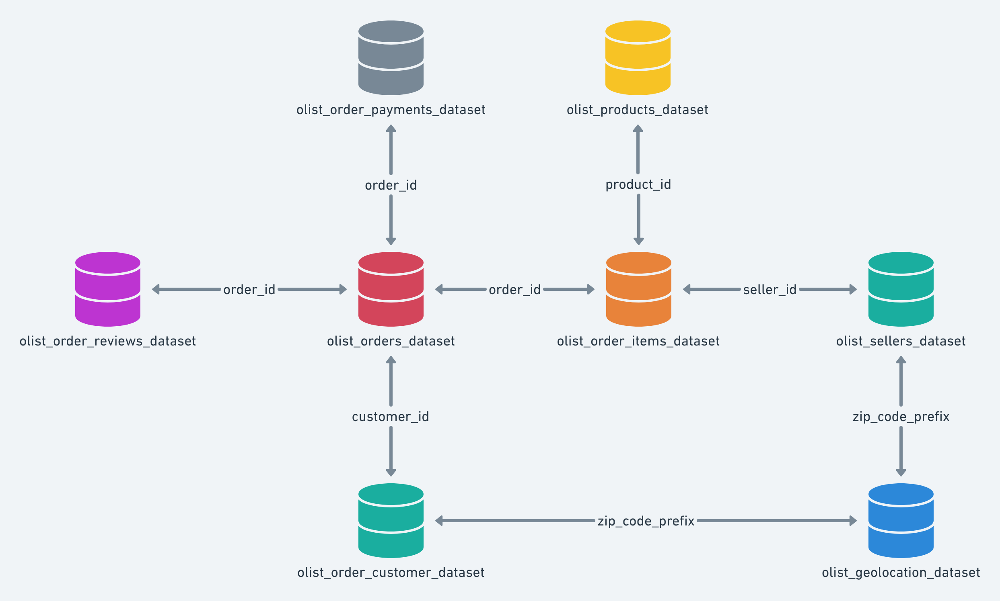

In [4]:


# df_data = pd.merge(df_order_reviews, df_orders, on='order_id', how='inner')
# df_data = pd.merge(df_data, df_order_items, on='order_id', how='inner')
# df_data = pd.merge(df_data, df_order_payments, on='order_id', how='inner')
# df_data = pd.merge(df_data, df_customers, on='customer_id', how='inner')
# df_data = pd.merge(df_data, df_products, on='product_id', how='inner')
# df_data = pd.merge(df_data, df_sellers, on='seller_id', how='inner')
# df_data = pd.merge(df_data, df_geolocation, left_on='seller_zip_code_prefix', right_on='geolocation_zip_code_prefix', how='inner')


# Merge order-related dataframes
# df_order_data = pd.merge(df_order_reviews, df_orders, on='order_id', how='inner')
# df_order_data = pd.merge(df_order_data, df_order_items, on='order_id', how='inner')
# df_order_data = pd.merge(df_order_data, df_order_payments, on='order_id', how='inner')

# # Merge order data with customer data
# df_data = pd.merge(df_order_data, df_customers, on='customer_id', how='inner')
# df_data = pd.merge(df_data, df_products, on='product_id', how='inner')



# Merge order-related dataframes
df_order_data = pd.merge(df_order_reviews, df_orders, on='order_id')
df_order_data = pd.merge(df_order_data, df_order_items, on='order_id')
df_order_data = pd.merge(df_order_data, df_order_payments, on='order_id')

# Merge order data with customer data
df_data = pd.merge(df_order_data, df_customers, on='customer_id')
df_data = pd.merge(df_data, df_products, on='product_id')


In [5]:
df_data

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,payment_sequential,payment_type,payment_installments,payment_value,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,2018-01-18 00:00:00,2018-01-18 21:46:59,41dcb106f807e993532d446263290104,delivered,2018-01-11 15:30:49,2018-01-11 15:47:59,2018-01-12 21:57:22,2018-01-17 18:42:41,2018-02-02 00:00:00,1,fd25ab760bfbba13c198fa3b4f1a0cd3,6d803cb79cc31c41c4c789a75933b3c7,2018-01-18 15:47:59,185.00,13.63,1,credit_card,8,397.26,68a5590b9926689be4e10f4ae2db21a8,6030,osasco,SP,esporte_lazer,42.0,858.0,1.0,1300.0,30.0,30.0,35.0
1,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,2018-01-18 00:00:00,2018-01-18 21:46:59,41dcb106f807e993532d446263290104,delivered,2018-01-11 15:30:49,2018-01-11 15:47:59,2018-01-12 21:57:22,2018-01-17 18:42:41,2018-02-02 00:00:00,2,fd25ab760bfbba13c198fa3b4f1a0cd3,6d803cb79cc31c41c4c789a75933b3c7,2018-01-18 15:47:59,185.00,13.63,1,credit_card,8,397.26,68a5590b9926689be4e10f4ae2db21a8,6030,osasco,SP,esporte_lazer,42.0,858.0,1.0,1300.0,30.0,30.0,35.0
2,e2655da8bccce2ddc2f43cc2c80d24f3,19721d59a9764437477eff0730b48665,5,NaN,NaN,2018-04-10 00:00:00,2018-04-11 11:30:43,b1757da2a461d581e1a3b280ca181b7c,delivered,2018-03-26 11:02:31,2018-03-26 11:15:38,2018-03-26 22:58:37,2018-04-09 21:53:23,2018-04-27 00:00:00,1,fd25ab760bfbba13c198fa3b4f1a0cd3,6d803cb79cc31c41c4c789a75933b3c7,2018-04-02 11:15:38,185.00,20.26,1,credit_card,3,205.26,059ba8400bf965adf606ecc7ef3396e9,95860,taquari,RS,esporte_lazer,42.0,858.0,1.0,1300.0,30.0,30.0,35.0
3,cb18f53b563f0bdeb76be0376ddd6b6a,efd626e6a12a82d76e456e34093f8356,5,NaN,NaN,2017-12-28 00:00:00,2017-12-30 12:07:50,da2bd16b131bc90653b87fe4d8fd266e,delivered,2017-12-07 20:33:24,2017-12-07 20:51:05,2017-12-08 18:12:34,2017-12-27 18:19:53,2018-01-08 00:00:00,1,fd25ab760bfbba13c198fa3b4f1a0cd3,6d803cb79cc31c41c4c789a75933b3c7,2017-12-14 20:51:05,185.00,17.05,1,credit_card,2,202.05,62a25a159f9fd2ab7c882d9407f49aa9,36500,uba,MG,esporte_lazer,42.0,858.0,1.0,1300.0,30.0,30.0,35.0
4,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,NaN,NaN,2018-03-10 00:00:00,2018-03-11 03:05:13,8a2e7ef9053dea531e4dc76bd6d853e6,delivered,2018-02-28 12:25:19,2018-02-28 12:48:39,2018-03-02 19:08:15,2018-03-09 23:17:20,2018-03-14 00:00:00,1,be0dbdc3d67d55727a65d4cd696ca73c,8e6d7754bc7e0f22c96d255ebda59eba,2018-03-06 12:48:39,79.79,8.30,1,credit_card,1,88.09,64190b91b656ab8f37eb89b93dc84584,13380,nova odessa,SP,informatica_acessorios,47.0,493.0,1.0,245.0,19.0,14.0,14.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
117324,58be140ccdc12e8908ff7fd2ba5c7cb0,0ebf8e35b9807ee2d717922d5663ccdb,5,muito bom produto,"Ficamos muito satisfeitos com o produto, atend...",2018-06-30 00:00:00,2018-07-02 23:09:35,9126539aa02befb9271bed176c06c637,delivered,2018-06-21 22:43:32,2018-06-21 22:57:28,2018-06-22 15:18:00,2018-06-29 19:21:05,2018-07-20 00:00:00,1,fc43d4931ce7b45c01dcf5289927dc01,59cea8e446d3834393058e7e0666b6fb,2018-06-27 22:57:28,249.90,20.94,2,voucher,1,100.00,c30e0e45d4256ff2f7ff26e600ad0f7c,95903,lajeado,RS,papelaria,59.0,1382.0,1.0,803.0,25.0,17.0,20.0
117325,7047578adefcc7c27319e3cf91ba1416,01da5549f136167573c8a302f008557a,5,NaN,"Produto original,prazo de entrega rápido.Super...",2018-04-18 00:00:00,2018-04-22 14:48:57,c6905c5022f61e99e31ded5f939e702b,delivered,2018-04-08

In [6]:
print(df_data['customer_id'].nunique())
print(df_data['customer_unique_id'].nunique())
print(df_data['order_id'].nunique())

97916
94720
97916


# I. CLEANING and FIRST EXPLORATION

## I.1. Check for Dtypes errors

In [7]:
# ==================================================================================================
# CHECK Dtype and modify if needed
# ==================================================================================================
df_data.dtypes

review_id                         object
order_id                          object
review_score                       int64
review_comment_title              object
review_comment_message            object
review_creation_date              object
review_answer_timestamp           object
customer_id                       object
order_status                      object
order_purchase_timestamp          object
order_approved_at                 object
order_delivered_carrier_date      object
order_delivered_customer_date     object
order_estimated_delivery_date     object
order_item_id                      int64
product_id                        object
seller_id                         object
shipping_limit_date               object
price                            float64
freight_value                    float64
payment_sequential                 int64
payment_type                      object
payment_installments               int64
payment_value                    float64
customer_unique_

In [8]:
# ==================================================================================================
# Let's correct the dtypes !
# ==================================================================================================
# DATES Columns
# List of date columns
date_columns = ['review_creation_date', 'review_answer_timestamp', 'order_purchase_timestamp', 
                'order_approved_at', 'order_delivered_carrier_date', 'order_delivered_customer_date', 
                'order_estimated_delivery_date', 'shipping_limit_date']

# Convert columns to datetime dtype
for column in date_columns:
    df_data[column] = pd.to_datetime(df_data[column])

## I.2. Get the basic stats about my features

In [9]:
# ==================================================================================================
# NUMBER OF NUMERICAL AND CATEGORICAL FEATURES
# ==================================================================================================
numeric_features = df_data.select_dtypes(include=['number']).columns.tolist()
categoric_features = df_data.select_dtypes(include=['object', 'category', 'bool', 'datetime']).columns.tolist()

print("Number of numerical features:", len(numeric_features))
print("Number of categorical features:", len(categoric_features))
print("TOTAL number of features:", len(categoric_features) + len(numeric_features))
print("  ")
num_rows = df_data.shape[0]
print("Number of rows:", num_rows)

Number of numerical features: 15
Number of categorical features: 21
TOTAL number of features: 36
  
Number of rows: 117329


In [10]:
# ==================================================================================================
# STATISTIQUES DESCRIPTIVES (NUMERICAL FEATURES)
# ==================================================================================================
def is_normal(skewness, kurtosis):
    return abs(skewness) < 1 and kurtosis > 2 and kurtosis < 4
    
# Calculate descriptive statistics for numerical features
numeric_stats = df_data[numeric_features].describe()
numeric_stats = numeric_stats.T

# Calculate mode, skewness, and kurtosis for numerical features
numeric_mode = df_data[numeric_features].mode().iloc[0]
numeric_skewness = df_data[numeric_features].skew()
numeric_kurtosis = df_data[numeric_features].kurtosis()

# Check if the distribution is normal
is_normal_feature = (numeric_skewness.abs() < 1) & \
                     (numeric_kurtosis > 2) & \
                     (numeric_kurtosis < 4)

# Concatenate descriptive statistics, mode, skewness, and kurtosis into a single DataFrame
combined_numeric_stats = pd.concat([numeric_stats, numeric_mode, numeric_skewness, numeric_kurtosis, is_normal_feature], axis=1)

# Rename the columns for clarity
combined_numeric_stats.columns = ['count', 'mean', 'std', 'min', '25%', '50%', '75%', 'max', 'mode', 'skewness', 'kurtosis', 'normal?']

# Print the combined dataframe for numerical features
print("Combined Descriptive Statistics, Mode, Skewness, and Kurtosis for Numerical Features:")
display(combined_numeric_stats)



# ==================================================================================================
# STATISTIQUES DESCRIPTIVES (CATEGORICAL FEATURES)
# ==================================================================================================
# # For categorical features, you can only calculate mode
categorical_mode = df_data[categoric_features].mode().iloc[0]

# # Print the mode for categorical features
print("\nMode for Categorical Features:")
display(categorical_mode)




Combined Descriptive Statistics, Mode, Skewness, and Kurtosis for Numerical Features:


,count,mean,std,min,25%,50%,75%,max,mode,skewness,kurtosis,normal?
review_score,117329.0,4.03,1.39,1.00,4.00,5.00,5.00,5.00,5.0,-1.27,0.20,False
order_item_id,117329.0,1.19,0.68,1.00,1.00,1.00,1.00,21.00,1.0,7.18,93.22,False
price,117329.0,120.52,182.94,0.85,39.90,74.90,134.90,6735.00,59.9,7.65,108.35,False
freight_value,117329.0,20.03,15.83,0.00,13.08,16.28,21.18,409.68,15.1,5.55,57.92,False
payment_sequential,117329.0,1.09,0.73,1.00,1.00,1.00,1.00,29.00,1.0,15.86,344.80,False
payment_installments,117329.0,2.94,2.78,0.00,1.00,2.00,4.00,24.00,1.0,1.62,2.52,False
payment_value,117329.0,172.06,265.39,0.00,60.75,108.10,189.06,13664.08,50.0,14.25,521.76,False
customer_zip_code_prefix,117329.0,35060.12,29849.50,1003.00,11250.00,24240.00,58770.00,99990.00,24220.0,0.78,-0.78,False
product_name_lenght,115634.0,48.77,10.03,5.00,42.00,52.00,57.00,76.00,59.0,-0.91,0.15,False
product_description_lenght,115634.0,785.80,652.38,4.00,346.00,600.00,983.00,3992.00,341.0,2.01,4.93,False



Mode for Categorical Features:


review_id                        eef5dbca8d37dfce6db7d7b16dd0525e
order_id                         895ab968e7bb0d5659d16cd74cd1650c
review_comment_title                                    Recomendo
review_comment_message                                  Muito bom
review_creation_date                          2017-12-19 00:00:00
review_answer_timestamp                       2017-08-17 22:17:55
customer_id                      270c23a11d024a44c896d1894b261a83
order_status                                            delivered
order_purchase_timestamp                      2017-08-08 20:26:31
order_approved_at                             2017-08-08 20:43:31
order_delivered_carrier_date                  2017-08-10 11:58:14
order_delivered_customer_date                 2017-08-14 12:46:18
order_estimated_delivery_date                 2017-12-20 00:00:00
product_id                       aca2eb7d00ea1a7b8ebd4e68314663af
seller_id                        4a3ca9315b744ce9f8e9374361493884
shipping_l

## I.3. Box plots

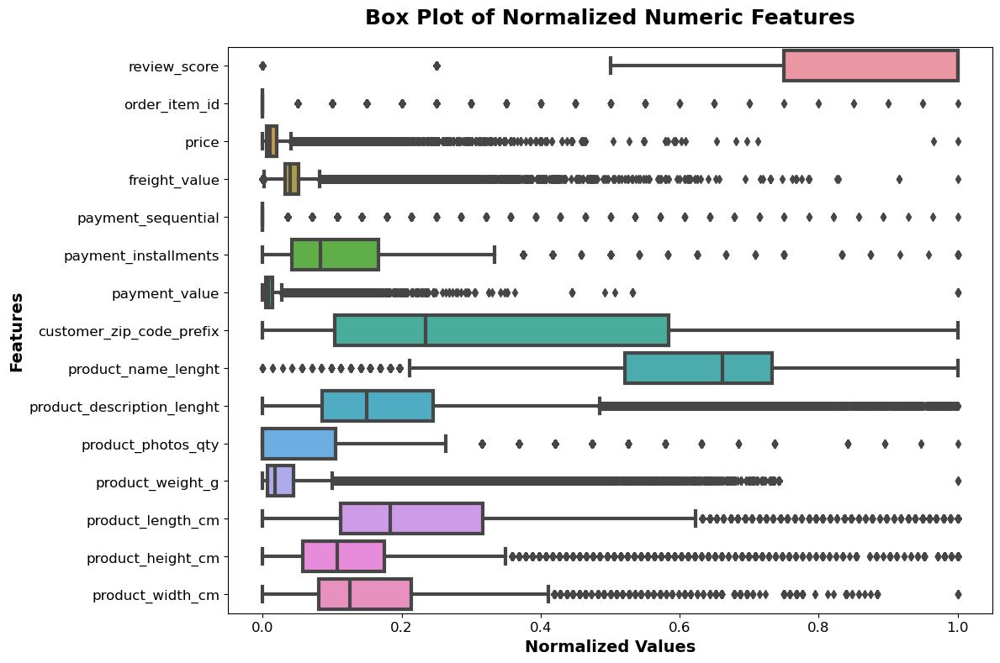

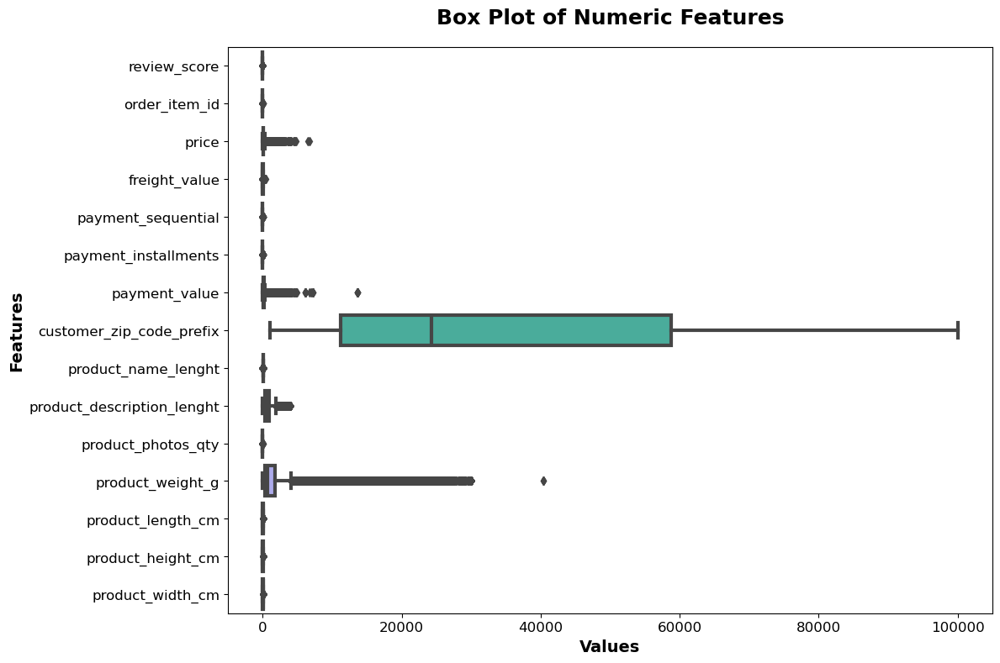

In [11]:
# ==================================================================================================
# BOXPLOTS
# ==================================================================================================

def plot_boxplot(features, df, b_normalize):
    """
    Function to plot box plots for numeric features after normalization.

    Parameters:
    - features: list of numeric feature names to plot box plots for
    - df: DataFrame containing the data
    """
    if b_normalize == True:
        # Normalize the data
        scaler = MinMaxScaler()
        df_normalized = pd.DataFrame(scaler.fit_transform(df[features]), columns=features)
    else:
        df_normalized = df
    plt.figure(figsize=(12, 8))
    
    # Create box plot for each feature
    sns.boxplot(data=df_normalized, orient="h")

    if b_normalize == True:
        plt.title("Box Plot of Normalized Numeric Features", fontsize=18, fontweight='bold')
        plt.xlabel("Normalized Values", fontsize=14, fontweight='bold')
    else:
        plt.title("Box Plot of Numeric Features", fontsize=18, fontweight='bold')
        plt.xlabel("Values", fontsize=14, fontweight='bold')
    plt.ylabel("Features", fontsize=14, fontweight='bold')
    
    plt.tight_layout()
    plt.show()

plot_boxplot(numeric_features, df_data, True)
plot_boxplot(numeric_features, df_data, False)

## I.3. Matrix of nullity

<Axes: >

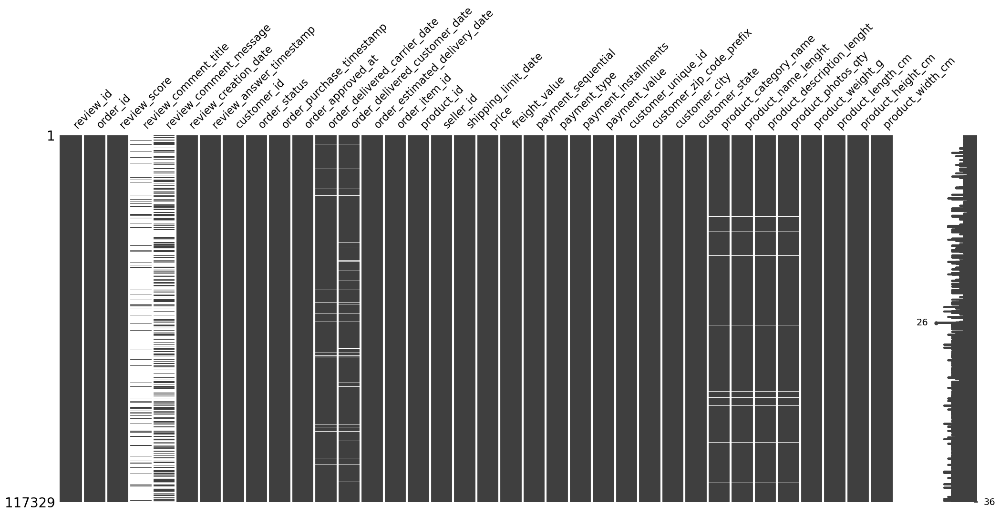

In [12]:
msno.matrix(df_data) 

## I.4. Correlation between numerical parameters

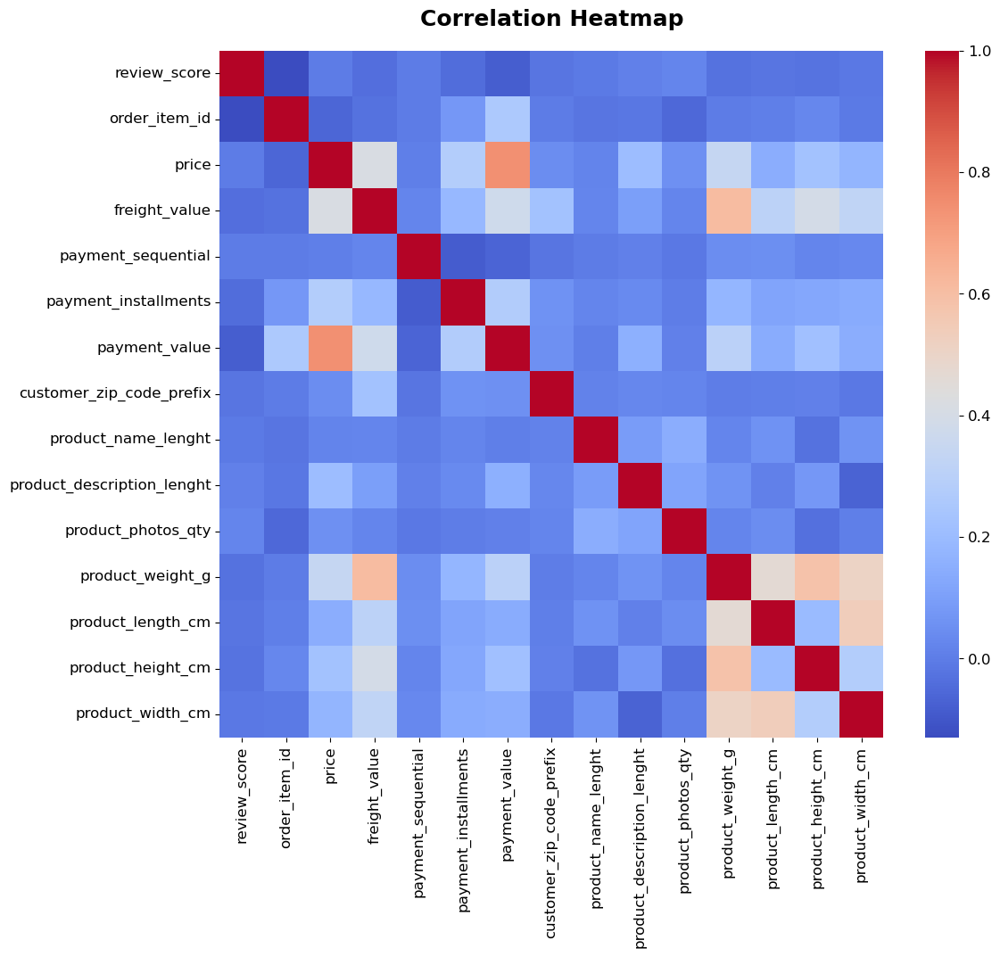

In [13]:
# ==================================================================================================
# PLOT CORRELATION HEATMAP
# ==================================================================================================
correlation_matrix = df_data[numeric_features].corr()

# Set a larger figure size
plt.figure(figsize=(12, 10))
heatmap  = sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm', fmt=".2f")

# Increase fontsize for x-axis and y-axis titles
heatmap.set_xlabel(heatmap.get_xlabel())
heatmap.set_ylabel(heatmap.get_ylabel())

plt.title('Correlation Heatmap')

plt.show()


# Find pairs with correlation greater than 0.9 or less than -0.9
coef_treshold = 0.8
high_correlation_pairs = []
for i in range(len(correlation_matrix.columns)):
    for j in range(i + 1, len(correlation_matrix.columns)):
        correlation = correlation_matrix.iloc[i, j]
        if abs(correlation) > coef_treshold:
            pair = (correlation_matrix.columns[i], correlation_matrix.columns[j], correlation)
            high_correlation_pairs.append(pair)

# Display the high correlation pairs
for pair in high_correlation_pairs:
    print(f"High Correlation (> {coef_treshold} ou < {-coef_treshold}): {pair[0]} - {pair[1]} = {pair[2]:.2f}")

# II. DUPLICATES

In [14]:
# ==================================================================================================
# CHECK FOR DUPLICATES
# ==================================================================================================
print("Nombre de lignes avant la suppression :", df_data.shape[0])
df_data = df_data.drop_duplicates()
print("Nombre de lignes après la suppression :", df_data.shape[0])



Nombre de lignes avant la suppression : 117329
Nombre de lignes après la suppression : 117329


# III. OUTLIERS

# IV. Missing Values

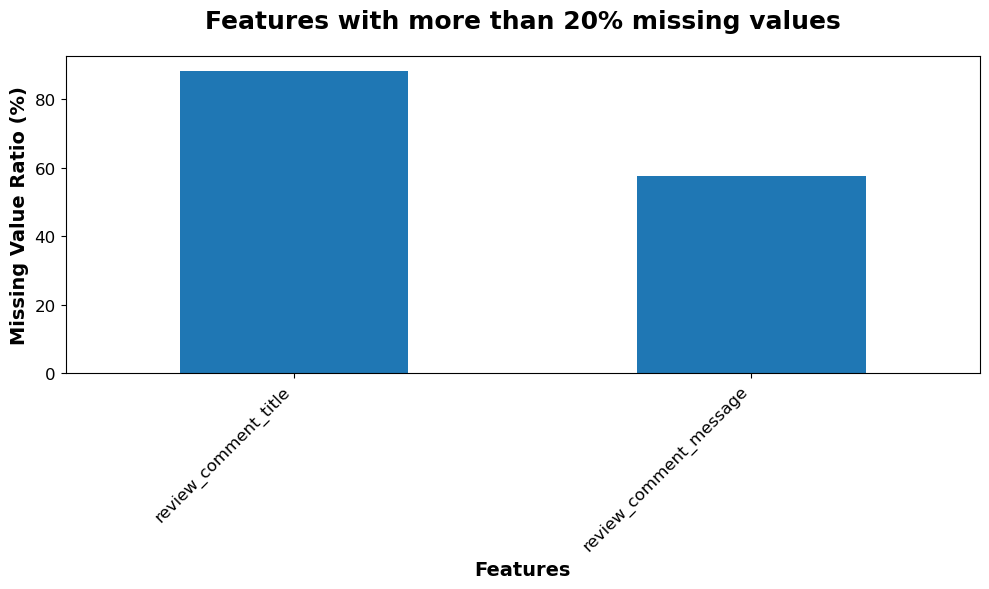

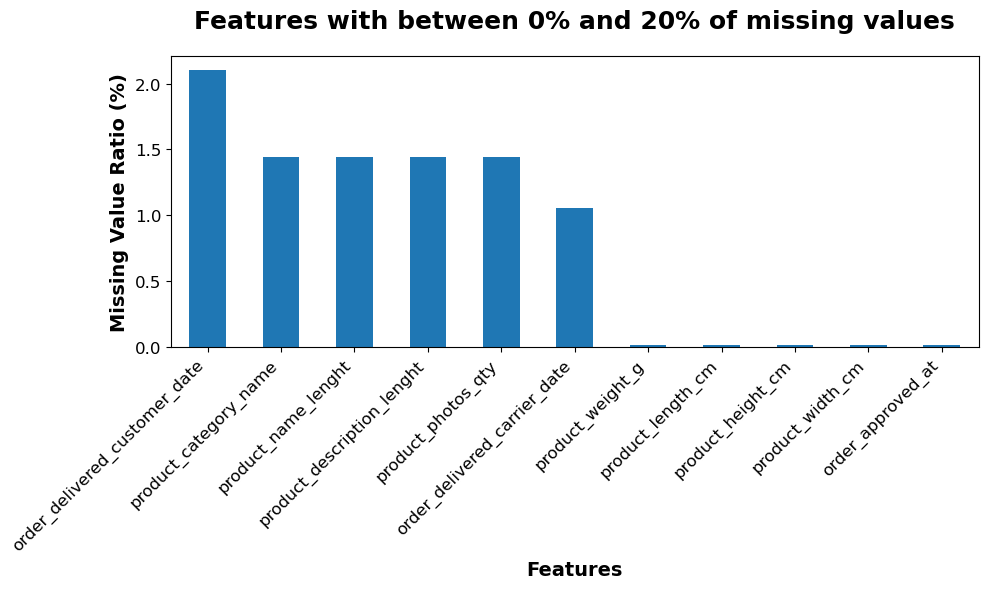

In [15]:
# ==================================================================================================
# PLOT MISSING VALUE RATIO BY FEATURES
# ==================================================================================================
# Calculate the total number of missing values for each feature
missing_values = df_data.isnull().sum()

# Calculate the total number of rows in the DataFrame
total_rows = df_data.shape[0]

# Calculate the missing value ratio for each feature
missing_value_ratio = (missing_values / total_rows) * 100

# Filter features with more than 20% missing values
features_with_missing_values = missing_value_ratio[missing_value_ratio > 20].sort_values(ascending=False)

# Plot the features with more than 20% missing values
plt.figure(figsize=(10, 6))
features_with_missing_values.plot(kind='bar')
plt.title('Features with more than 20% missing values')
plt.xlabel('Features')
plt.ylabel('Missing Value Ratio (%)')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


# Filter features between 0% and 20% of missing values
features_with_some_missing_values = missing_value_ratio[(missing_value_ratio > 0) & (missing_value_ratio <= 20)].sort_values(ascending=False)

# Plot the features between 0% and 20% of missing values
plt.figure(figsize=(10, 6))
features_with_some_missing_values.plot(kind='bar')
plt.title('Features with between 0% and 20% of missing values')
plt.xlabel('Features')
plt.ylabel('Missing Value Ratio (%)')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

In [16]:
df_data = df_data.drop(columns=['review_comment_title', 'review_comment_message'])

# V. COMMANDS (ROW) & Feature SELECTION

## V.1. order_status : delivered. 

In [17]:
value_counts = df_data['order_status'].value_counts()
display(value_counts)

order_status
delivered      114859
shipped          1167
canceled          553
invoiced          370
processing        370
unavailable         7
approved            3
Name: count, dtype: int64

In [18]:
print("Nombre de lignes avant la suppression :", df_data.shape[0])
df_data = df_data[df_data['order_status'] == 'delivered']
print("Nombre de lignes après la suppression :", df_data.shape[0])

# We delete the column 'order_status' now. 
df_data = df_data.drop(columns=['order_status'])

Nombre de lignes avant la suppression : 117329
Nombre de lignes après la suppression : 114859


## V.2. Delete rows with NaN for features 'order_approved_at', 'order_delivered_customer_date' and 'order_delivered_carrier_date'

In [19]:
print("Nombre de lignes avant la suppression :", df_data.shape[0])

# Define the columns to check for NaN values
columns_to_check = ['order_approved_at', 'order_delivered_customer_date', 'order_delivered_carrier_date', 
                    'product_category_name', 'product_name_lenght', 'product_description_lenght', 
                    'product_photos_qty', 'product_weight_g', 'product_length_cm', 'product_height_cm', 
                    'product_width_cm']
# Drop rows where any of the specified columns have NaN values
df_data = df_data.dropna(subset=columns_to_check)

# Print the shape of the cleaned DataFrame to see the number of rows after removal
print("Nombre de lignes après la suppression :", df_data.shape[0])


Nombre de lignes avant la suppression : 114859
Nombre de lignes après la suppression : 113209


In [20]:
# Check for missing values in the cleaned DataFrame
remaining_missing_values = df_data.isnull().sum()

# Print the remaining missing values
print("Remaining missing values after cleaning:")
print(remaining_missing_values)

Remaining missing values after cleaning:
review_id                        0
order_id                         0
review_score                     0
review_creation_date             0
review_answer_timestamp          0
customer_id                      0
order_purchase_timestamp         0
order_approved_at                0
order_delivered_carrier_date     0
order_delivered_customer_date    0
order_estimated_delivery_date    0
order_item_id                    0
product_id                       0
seller_id                        0
shipping_limit_date              0
price                            0
freight_value                    0
payment_sequential               0
payment_type                     0
payment_installments             0
payment_value                    0
customer_unique_id               0
customer_zip_code_prefix         0
customer_city                    0
customer_state                   0
product_category_name            0
product_name_lenght              0
product_descri

## V.3. customer_id or customer_unique_id ? 

In [21]:
# --> We come back on the information from the mail of João ! :D
ratio_customer_multiple_commands = df_data['customer_id'].nunique()/df_data['customer_unique_id'].nunique() - 1
print('Nombre de clients qui ont réalisé plusieurs commandes : {:.2f}%'.format(ratio_customer_multiple_commands * 100))

# We delete customer_unique_id
df_data = df_data.drop(columns=['customer_id'])

Nombre de clients qui ont réalisé plusieurs commandes : 3.29%


## V.3. payment_sequential ? 

In [22]:
# Note: 'payment_sequential' indicates the sequential order of payment. Non Usefull. 

In [23]:
df_data = df_data.drop(columns=['payment_sequential'])

## V.4. Date Features ?

In [24]:
print("Nombre de colonnes avant la suppression :", df_data.shape[1])
df_data = df_data.drop(["order_approved_at", "order_delivered_carrier_date"], axis=1)
print("Nombre de colonnes après la suppression :", df_data.shape[1])

Nombre de colonnes avant la suppression : 31
Nombre de colonnes après la suppression : 29


## V.5. review_creation_date

In [25]:
print("Nombre de colonnes avant la suppression :", df_data.shape[1])
df_data = df_data.drop(['review_creation_date'], axis=1)
print("Nombre de colonnes après la suppression :", df_data.shape[1])

Nombre de colonnes avant la suppression : 29
Nombre de colonnes après la suppression : 28


## V.6. Multiple reviews for the same command

In [26]:
# Calculate the number of unique review scores for each order_id
unique_review_scores = df_data.groupby('order_id')['review_score'].nunique()

# Display the order_ids where the number of unique review scores is greater than 1
multiple_scores = unique_review_scores[unique_review_scores > 1]

# Create a list of order_ids that have multiple review_score values
order_ids = multiple_scores.index.tolist()

# Filter the rows of the dataframe using the list of order_ids
filtered_df_data = df_data[df_data['order_id'].isin(order_ids)]

filtered_df_data.head()


,review_id,order_id,review_score,review_answer_timestamp,order_purchase_timestamp,order_delivered_customer_date,order_estimated_delivery_date,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,payment_type,payment_installments,payment_value,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
529,8ee90ac383cf825bb7f4756130d4e74a,8e350e1e4254bd7c68913b98bde7d3a7,5,2017-06-02 18:16:17,2017-05-19 15:41:12,2017-05-31 06:25:38,2017-06-14,1,35afc973633aaeb6b877ff57b2793310,4a3ca9315b744ce9f8e9374361493884,2017-05-26 15:50:07,89.9,15.38,credit_card,6,210.56,88ecb91d6d5e47ebdc2129cd046b0935,30840,belo horizonte,MG,casa_conforto,56.0,176.0,1.0,1825.0,53.0,10.0,40.0
530,260b8badf10666253ac8a8eda99119f9,8e350e1e4254bd7c68913b98bde7d3a7,1,2017-06-02 18:29:03,2017-05-19 15:41:12,2017-05-31 06:25:38,2017-06-14,1,35afc973633aaeb6b877ff57b2793310,4a3ca9315b744ce9f8e9374361493884,2017-05-26 15:50:07,89.9,15.38,credit_card,6,210.56,88ecb91d6d5e47ebdc2129cd046b0935,30840,belo horizonte,MG,casa_conforto,56.0,176.0,1.0,1825.0,53.0,10.0,40.0
545,03fdc89fe3999cec7b3f35eda0d6343f,7d4101163410b1380268da3933e691f1,3,2017-08-09 00:04:57,2017-07-20 23:03:33,2017-07-26 20:17:41,2017-08-21,1,35afc973633aaeb6b877ff57b2793310,4a3ca9315b744ce9f8e9374361493884,2017-07-26 23:15:14,89.9,17.07,credit_card,4,213.94,d9752ac494a2b97507fd2faa478cabd9,45028,vitoria da conquista,BA,casa_conforto,56.0,176.0,1.0,1825.0,53.0,10.0,40.0
546,fd684b9378d1ce2b1b782508c7497990,7d4101163410b1380268da3933e691f1,1,2017-07-28 00:51:49,2017-07-20 23:03:33,2017-07-26 20:17:41,2017-08-21,1,35afc973633aaeb6b877ff57b2793310,4a3ca9315b744ce9f8e9374361493884,2017-07-26 23:15:14,89.9,17.07,credit_card,4,213.94,d9752ac494a2b97507fd2faa478cabd9,45028,vitoria da conquista,BA,casa_conforto,56.0,176.0,1.0,1825.0,53.0,10.0,40.0
4034,347fd10f9949b67e2039a7c62611b20f,e433edc92cb5e3ae5515301b3309e303,3,2018-03-30 19:35:46,2018-02-25 13:06:17,2018-03-19 22:36:35,2018-03-20,1,4298b7e67dc399c200662b569563a2b2,88460e8ebdecbfecb5f9601833981930,2018-03-05 03:10:38,149.9,13.18,boleto,1,489.24,a5c93e7b12545f61cbf92efa2d77f1f3,16200,birigui,SP,informatica_acessorios,58.0,420.0,1.0,200.0,21.0,14.0,15.0


In [27]:
# Print the number of rows before deletion
print("Nombre de lignes avant la suppression :", df_data.shape[0])


# Group by 'order_id' and get the number of unique 'product_id's
grouped = df_data.groupby('order_id')['product_id'].nunique()

# Find the 'order_id's that have more than one unique 'product_id'
order_ids_with_multiple_products = grouped[grouped > 1].index

# Filter to keep the rows where 'order_id' has more than one unique 'product_id'
df_multiple_products = df_data[df_data['order_id'].isin(order_ids_with_multiple_products)]

# For the remaining 'order_id's, sort and remove duplicates
df_remaining = df_data[~df_data['order_id'].isin(order_ids_with_multiple_products)]
df_remaining = df_remaining.sort_values(['order_id', 'review_answer_timestamp'])
df_remaining = df_remaining.drop_duplicates(subset='order_id', keep='last')

# Concatenate the two DataFrames to get the final result
df_data = pd.concat([df_multiple_products, df_remaining])

# Print the number of rows after deletion
print("Nombre de lignes apres la suppression :", df_data.shape[0])


Nombre de lignes avant la suppression : 113209
Nombre de lignes apres la suppression : 99333


In [28]:
# We drop 'review_answer_timestamp' since it is not usefull anymore. 
print("Nombre de colonnes avant la suppression :", df_data.shape[1])
df_data = df_data.drop(['review_answer_timestamp'], axis=1)
print("Nombre de colonnes après la suppression :", df_data.shape[1])

Nombre de colonnes avant la suppression : 28
Nombre de colonnes après la suppression : 27


## V.7. 'product_name_lenght' and 'product_description_lenght' ?

In [29]:
print("Nombre de colonnes avant la suppression :", df_data.shape[1])
df_data = df_data.drop(['product_name_lenght', 'product_description_lenght'], axis=1)
print("Nombre de colonnes après la suppression :", df_data.shape[1])

Nombre de colonnes avant la suppression : 27
Nombre de colonnes après la suppression : 25


## V.8. Creation of Delivery_Delay

In [30]:
# Calculate Delivery_Delay
df_data['Delivery_Delay'] = (df_data['order_delivered_customer_date'] - df_data['order_estimated_delivery_date']).dt.days

# Now 'order_estimated_delivery_date' are not usefull anymore. 
print("Nombre de colonnes avant la suppression :", df_data.shape[1])
df_data = df_data.drop(['order_estimated_delivery_date'], axis=1)
print("Nombre de colonnes après la suppression :", df_data.shape[1])

Nombre de colonnes avant la suppression : 26
Nombre de colonnes après la suppression : 25


## V.9. Non Usefull Features

In [31]:
# Now 'order_delivered_customer_date' and 'order_estimated_delivery_date' are not usefull anymore. 
print("Nombre de colonnes avant la suppression :", df_data.shape[1])
df_data = df_data.drop(['shipping_limit_date'], axis=1)
print("Nombre de colonnes après la suppression :", df_data.shape[1])

Nombre de colonnes avant la suppression : 25
Nombre de colonnes après la suppression : 24


## V.10. Categorical Features with too much unique value (the one we don't want to one-hot encode)

In [32]:
columns_list = [
    "payment_type", 
    "customer_zip_code_prefix", 
    "customer_city", 
    "customer_state", 
    'product_category_name',
]

unique_counts = pd.DataFrame(df_data[columns_list].nunique(), columns=['Number_of_unique_values'])
unique_counts_sorted = unique_counts.sort_values(by='Number_of_unique_values', ascending=False)
unique_counts_sorted

,Number_of_unique_values
customer_zip_code_prefix,14825
customer_city,4071
product_category_name,73
customer_state,27
payment_type,4


In [33]:
# Now 'order_delivered_customer_date' and 'order_estimated_delivery_date' are not usefull anymore. 
print("Nombre de colonnes avant la suppression :", df_data.shape[1])
df_data = df_data.drop(['customer_zip_code_prefix', 'customer_city'], axis=1)
print("Nombre de colonnes après la suppression :", df_data.shape[1])

Nombre de colonnes avant la suppression : 24
Nombre de colonnes après la suppression : 22


# VI. Interactive Maps of customers in Brazil (sample of 61k order from 2018)

In [34]:


# ==================================================================================================
# How customers are distributed in Brazil? (a 61k orders sample from 2018 in a map)
# First Step, merge the orders data to order_items data and geoloc
# Second Step, Use an API (brazilian government) to return the region of each customer_state ( https://servicodados.ibge.gov.br/api/docs/localidades?versao=1)
# REF : Thanks to Andre Sionek that threated the geolocation lat and long on his kernel! (https://www.kaggle.com/code/andresionek/geospatial-analysis-of-brazilian-e-commerce)
# ==================================================================================================
# Merging orders and order_items
df_orders = df_orders.merge(df_customers, how='left', on='customer_id')
df_orders_items = df_orders.merge(df_order_items, how='left', on='order_id')
# df_orders_items = pd.merge(df_orders_items, df_geolocation, left_on='customer_zip_code_prefix', right_on='geolocation_zip_code_prefix', how='inner')
df_orders.drop(['customer_unique_id', 'customer_zip_code_prefix', 'customer_state', 'customer_city'], axis=1, inplace=True)


# Using the API to bring the region to the data
r = requests.get('https://servicodados.ibge.gov.br/api/v1/localidades/mesorregioes')
content = [c['UF'] for c in json.loads(r.text)]
br_info = pd.DataFrame(content)
br_info['nome_regiao'] = br_info['regiao'].apply(lambda x: x['nome'])
br_info.drop('regiao', axis=1, inplace=True)
br_info.drop_duplicates(inplace=True)

# Threating geolocations outside brazilian map.
# There are some outliers coordiantes in the dataset that are outside of brazilian territory. Let's guarantee that all coordinates are within a rectangle delimited by the limits of Brazil. 
# Brazils most Northern spot is at 5 deg 16′ 27.8″ N latitude.;
geo_prep = df_geolocation[df_geolocation.geolocation_lat <= 5.27438888]
#it’s most Western spot is at 73 deg, 58′ 58.19″W Long.
geo_prep = geo_prep[geo_prep.geolocation_lng >= -73.98283055]
#It’s most southern spot is at 33 deg, 45′ 04.21″ S Latitude.
geo_prep = geo_prep[geo_prep.geolocation_lat >= -33.75116944]
#It’s most Eastern spot is 34 deg, 47′ 35.33″ W Long.
geo_prep = geo_prep[geo_prep.geolocation_lng <=  -34.79314722]
geo_group = geo_prep.groupby(by='geolocation_zip_code_prefix', as_index=False).min()

# Merging all the informations
df_orders_items = df_orders_items.merge(br_info, how='left', left_on='customer_state', right_on='sigla')
df_orders_items = df_orders_items.merge(geo_group, how='left', left_on='customer_zip_code_prefix', 
                                        right_on='geolocation_zip_code_prefix')



# ==================================================================================================
# How customers are distributed in Brazil? (a 61k orders sample from 2018 in a map)
# Third Step, Plot the folium map
# ==================================================================================================
# Changing the data type for date columns
timestamp_cols = ['order_purchase_timestamp', 'order_approved_at', 'order_delivered_carrier_date', 
                  'order_estimated_delivery_date']
for col in timestamp_cols:
    df_orders_items[col] = pd.to_datetime(df_orders_items[col])
    
df_orders_items['order_purchase_year'] = df_orders_items['order_purchase_timestamp'].apply(lambda x: x.year)

# Zipping locations
lats = list(df_orders_items.query('order_purchase_year == 2018')['geolocation_lat'].dropna().values)
longs = list(df_orders_items.query('order_purchase_year == 2018')['geolocation_lng'].dropna().values)
locations = list(zip(lats, longs))
# Creating a mapa using folium
map1 = folium.Map(location=[-15, -50], zoom_start=4.0)

# Plugin: FastMarkerCluster
FastMarkerCluster(data=locations).add_to(map1)

map1

In [35]:
# Filter df_orders_items by the column 'order_purchase_year' for the value 2018
filtered_values = list(df_orders_items.query('order_purchase_year == 2018')['geolocation_lat'].dropna().values)
longs = len(list(df_orders_items.query('order_purchase_year == 2018')['geolocation_lng'].dropna().values))
# Get the number of values in the list
num_values = len(filtered_values)

print("Number of values:", num_values)
print(longs)

Number of values: 61485
61485


In [36]:
# ==================================================================================================
# How customers are distributed in Brazil? (a 30k orders sample from 2018 in a map)
# HeatMap
# ==================================================================================================
# Filter df_orders_items by the column 'order_purchase_year' for the value 2018
df_orders_items_filtered = df_orders_items[df_orders_items['order_purchase_year'] == 2018]

# Grouping geolocation data for plotting a heatmap
heat_data = df_orders_items_filtered.groupby(by=['geolocation_lat', 'geolocation_lng'], as_index=False).count().iloc[:, :3]

# Creating a mapa using folium
map1 = folium.Map(
    location=[-15, -50], 
    zoom_start=4.0, 
    tiles='cartodbdark_matter'
)

# Plugin: HeatMap
HeatMap(
    name='Heatmap - Order Purchase',
    data=heat_data,
    radius=10,
    max_zoom=13
).add_to(map1)

map1

# VII. Feature Engineering (RFM)

## VII.1. Delete Payment Anomalies

In [37]:
print("Number of rows before removing duplicates:", len(df_data))

# Drop duplicate rows, keeping the first occurrence
df_data = df_data.drop_duplicates()
print("Number of rows after removing duplicates:", len(df_data))

Number of rows before removing duplicates: 99333
Number of rows after removing duplicates: 99247


In [38]:
# Compute the total price and total freight value for each order of each customer
order_totals = df_data.groupby(['customer_unique_id', 'order_purchase_timestamp']).agg({
    'price': 'sum',
    'freight_value': 'sum',
    'payment_value': 'sum'
}).reset_index()

# Compute the total payment for each order
order_totals['total_payment'] = order_totals['price'] + order_totals['freight_value']

# Find rows where the equality is not respected
anomalies = order_totals[order_totals['payment_value'] != order_totals['total_payment']]

# Round 'payment_value' and 'total_payment' to the same number of decimal places
anomalies['rounded_payment_value'] = anomalies['payment_value'].round(2)
anomalies['rounded_total_payment'] = anomalies['total_payment'].round(2)

# Find rows where the rounded values are not equal
rounded_anomalies = anomalies[anomalies['rounded_payment_value'] != anomalies['rounded_total_payment']]

# Display the rounded anomalies
display(rounded_anomalies)


C:\Users\Olivi\AppData\Local\Temp\ipykernel_21528\2780735240.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  anomalies['rounded_payment_value'] = anomalies['payment_value'].round(2)
C:\Users\Olivi\AppData\Local\Temp\ipykernel_21528\2780735240.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  anomalies['rounded_total_payment'] = anomalies['total_payment'].round(2)


,customer_unique_id,order_purchase_timestamp,price,freight_value,payment_value,total_payment,rounded_payment_value,rounded_total_payment
7,00053a61a98854899e70ed204dd4bafe,2018-02-28 11:15:41,382.0,37.18,838.36,419.18,838.36,419.18
18,000de6019bb59f34c099a907c151d855,2017-08-17 19:10:33,229.8,27.64,514.88,257.44,514.88,257.44
19,000e309254ab1fc5ba99dd469d36bdb4,2018-06-25 09:53:57,59.9,18.52,69.89,78.42,69.89,78.42
22,000fbf0473c10fc1ab6f8d2d286ce20c,2018-07-26 09:43:52,285.8,76.56,1449.52,362.36,1449.52,362.36
25,001147e649a7b1afd577e873841632dd,2017-08-31 17:12:56,85.0,21.08,212.16,106.08,212.16,106.08
...,...,...,...,...,...,...,...,...
94206,ffeddf8aa7cdecf403e77b2e9a99e2ea,2018-05-13 16:04:51,165.0,39.20,38.50,204.20,38.50,204.20
94213,fff22793223fe80c97a8fd02ac5c6295,2018-06-26 11:01:47,22.0,7.73,89.19,29.73,89.19,29.73
94217,fff5eb4918b2bf4b2da476788d42051c,2018-07-02 16:39:59,175.0,299.16,2844.96,474.16,2844.96,474.16
94219,fff7219c86179ca6441b8f37823ba3d3,2017-12-27 18:57:38,245.8,20.00,531.60,265.80,531.60,265.80


In [39]:
# Merge df_data with rounded_anomalies on 'customer_unique_id' and 'order_purchase_timestamp'
merged_data = df_data.merge(rounded_anomalies[['customer_unique_id', 'order_purchase_timestamp']], 
                            on=['customer_unique_id', 'order_purchase_timestamp'], 
                            how='left', 
                            indicator=True)

# Remove rows where the merge indicator is both
cleaned_data = merged_data[merged_data['_merge'] != 'both']

# Drop the merge indicator column
cleaned_data = cleaned_data.drop('_merge', axis=1)

print("Nombre de lignes avant la suppression :", df_data.shape[0])
# Assign the cleaned DataFrame to df_data
df_data = cleaned_data
print("Nombre de lignes apres la suppression :", df_data.shape[0])

# Display the cleaned DataFrame
display(df_data)

Nombre de lignes avant la suppression : 99247
Nombre de lignes apres la suppression : 82512


,review_id,order_id,review_score,order_purchase_timestamp,order_delivered_customer_date,order_item_id,product_id,seller_id,price,freight_value,payment_type,payment_installments,payment_value,customer_unique_id,customer_state,product_category_name,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,Delivery_Delay
88,388cbb1c522560ab7ce433479008a132,68c3f2fc647e6d809af24b6ccbe84388,4,2017-05-18 20:51:06,2017-06-02 11:26:06,2,4ee0872b98a6a08ce8c8b65e2502842d,efcd8d2104f1a05d028af7bad20d974b,69.99,22.07,credit_card,6,65.84,a7657330b1c135f3acd420326e335b2c,MG,fashion_bolsas_e_acessorios,1.0,100.0,17.0,3.0,12.0,-7
89,388cbb1c522560ab7ce433479008a132,68c3f2fc647e6d809af24b6ccbe84388,4,2017-05-18 20:51:06,2017-06-02 11:26:06,2,4ee0872b98a6a08ce8c8b65e2502842d,efcd8d2104f1a05d028af7bad20d974b,69.99,22.07,voucher,1,84.48,a7657330b1c135f3acd420326e335b2c,MG,fashion_bolsas_e_acessorios,1.0,100.0,17.0,3.0,12.0,-7
103,2279376bb3fd1f41ce021f27e631cd7b,8af6d93e9fcfcf7b686b0cf6d0d84239,4,2018-07-21 20:26:41,2018-07-24 17:26:46,2,2028bf1b01cafb2d2b1901fca4083222,cc419e0650a3c5ba77189a1882b7556a,49.99,2.74,voucher,1,80.44,6fddad01fc95963a667e3d96d751d051,SP,perfumaria,2.0,250.0,20.0,8.0,21.0,-9
104,2279376bb3fd1f41ce021f27e631cd7b,8af6d93e9fcfcf7b686b0cf6d0d84239,4,2018-07-21 20:26:41,2018-07-24 17:26:46,2,2028bf1b01cafb2d2b1901fca4083222,cc419e0650a3c5ba77189a1882b7556a,49.99,2.74,credit_card,1,29.72,6fddad01fc95963a667e3d96d751d051,SP,perfumaria,2.0,250.0,20.0,8.0,21.0,-9
170,1ffe410191d36735e6c5278769a8abc4,723e462ce1ee50e024887c0b403130f3,1,2018-01-06 20:03:11,2018-01-22 23:18:57,1,7f4e034245e45549110139d1de248f83,4b9750c8ad28220fe6702d4ecb7c898f,48.90,11.50,credit_card,1,13.80,8fcf63613662e902d775fa5aa245c5e0,RJ,bebes,1.0,600.0,20.0,13.0,13.0,-17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99242,9185f849f32d82e216a4e025e0c50f5c,fffc94f6ce00a00581880bf54a75a037,5,2018-04-23 13:57:06,2018-05-10 22:56:40,1,4aa6014eceb682077f9dc4bffebc05b0,b8bc237ba3788b23da09c0f1f3a3288c,299.99,43.41,boleto,1,343.40,0c9aeda10a71f369396d0c04dce13a64,MA,utilidades_domesticas,3.0,10150.0,89.0,15.0,40.0,-8
99243,be803f6a93d64719fd685c1cc610918a,fffcd46ef2263f404302a634eb57f7eb,5,2018-07-14 10:26:46,2018-07-23 20:31:55,1,32e07fd915822b0765e448c4dd74c828,f3c38ab652836d21de61fb8314b69182,350.00,36.53,boleto,1,386.53,0da9fe112eae0c74d3ba1fe16de0988b,PR,informatica_acessorios,1.0,8950.0,45.0,26.0,38.0,-9
99244,dbdd81cd59a1a9f94a10a990b4d48dce,fffce4705a9662cd70adb13d4a31832d,5,2017-10-23 17:07:56,2017-10-28 12:22:22,1,72a30483855e2eafc67aee5dc2560482,c3cfdc648177fdbbbb35635a37472c53,99.90,16.95,credit_card,3,116.85,cd79b407828f02fdbba457111c38e4c4,SP,esporte_lazer,1.0,967.0,21.0,24.0,19.0,-13
99245,fba117c9ac40d41ca7be54741f471303,fffe18544ffabc95dfada21779c9644f,5,2017-08-14 23:02:59,2017-08-16 21:59:40,1,9c422a519119dcad7575db5af1ba540e,2b3e4a2a3ea8e01938cabda2a3e5cc79,55.99,8.72,credit_card,3,64.71,eb803377c9315b564bdedad672039306,SP,informatica_acessorios,1.0,100.0,20.0,20.0,20.0,-9


In [40]:
unique_combinations = df_data.groupby(['customer_unique_id', 'order_purchase_timestamp']).ngroup().nunique()
print("Number of unique combinations of customer_unique_id and order_purchase_timestamp:", unique_combinations)

unique_combinations = df_data['customer_unique_id'].nunique()
print("Number of unique combinations of customer_unique_id :", unique_combinations)

Number of unique combinations of customer_unique_id and order_purchase_timestamp: 82122
Number of unique combinations of customer_unique_id : 80144


## VII.2. CREATE RFM FEATURES

In [41]:
# Convert timestamp columns to datetime
df_data['order_purchase_timestamp'] = pd.to_datetime(df_data['order_purchase_timestamp'])
df_data['order_delivered_customer_date'] = pd.to_datetime(df_data['order_delivered_customer_date'])

# Compute Recency
max_purchase_date = df_data['order_purchase_timestamp'].max()
df_recency = df_data.groupby('customer_unique_id')['order_purchase_timestamp'].max().reset_index()
df_recency['recency'] = (max_purchase_date - df_recency['order_purchase_timestamp']).dt.days

# Compute Frequency
df_frequency = df_data.groupby('customer_unique_id')['order_id'].nunique().reset_index()
df_frequency.columns = ['customer_unique_id', 'frequency']

# Compute Monetary Value
df_monetary = df_data.groupby('customer_unique_id')[['payment_value', 'freight_value']].sum().reset_index()
df_monetary['total_payment'] = df_monetary['payment_value'] + df_monetary['freight_value']
df_monetary.drop(['payment_value', 'freight_value'], axis=1, inplace=True)


# Merge Recency, Frequency, and Monetary Value
df_rfm = pd.merge(df_recency, df_frequency, on='customer_unique_id')
df_rfm = pd.merge(df_rfm, df_monetary, on='customer_unique_id')

print('df_recency shape   = '  , df_recency.shape)
print('df_frequency shape = ', df_frequency.shape)
print('df_monetary shape  = ' , df_monetary.shape)
print('df_rfm shape       = '      , df_rfm.shape)

print('frequency unique   = ', df_rfm['frequency'].unique())
# Display the resulting RFM dataframe
display(df_rfm)

df_recency shape   =  (80144, 3)
df_frequency shape =  (80144, 2)
df_monetary shape  =  (80144, 2)
df_rfm shape       =  (80144, 5)
frequency unique   =  [ 1  2  3  4  6  5 14]


,customer_unique_id,order_purchase_timestamp,recency,frequency,total_payment
0,0000366f3b9a7992bf8c76cfdf3221e2,2018-05-10 10:56:27,111,1,153.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,2018-05-07 11:11:27,114,1,35.48
2,0000f46a3911fa3c0805444483337064,2017-03-10 21:05:03,536,1,103.44
3,0000f6ccb0745a6a4b88665a16c9f078,2017-10-12 20:29:41,320,1,61.25
4,0004aac84e0df4da2b147fca70cf8255,2017-11-14 19:45:42,287,1,213.78
...,...,...,...,...,...
80139,fffb09418989a0dbff854a28163e47c6,2017-12-17 19:14:35,254,1,88.32
80140,fffea47cd6d3cc0a88bd621562a9d061,2017-12-10 20:07:56,261,1,104.27
80141,ffff371b4d645b6ecea244b27531430a,2017-02-07 15:49:16,567,1,135.02
80142,ffff5962728ec6157033ef9805bacc48,2018-05-02 15:17:41,118,1,152.38


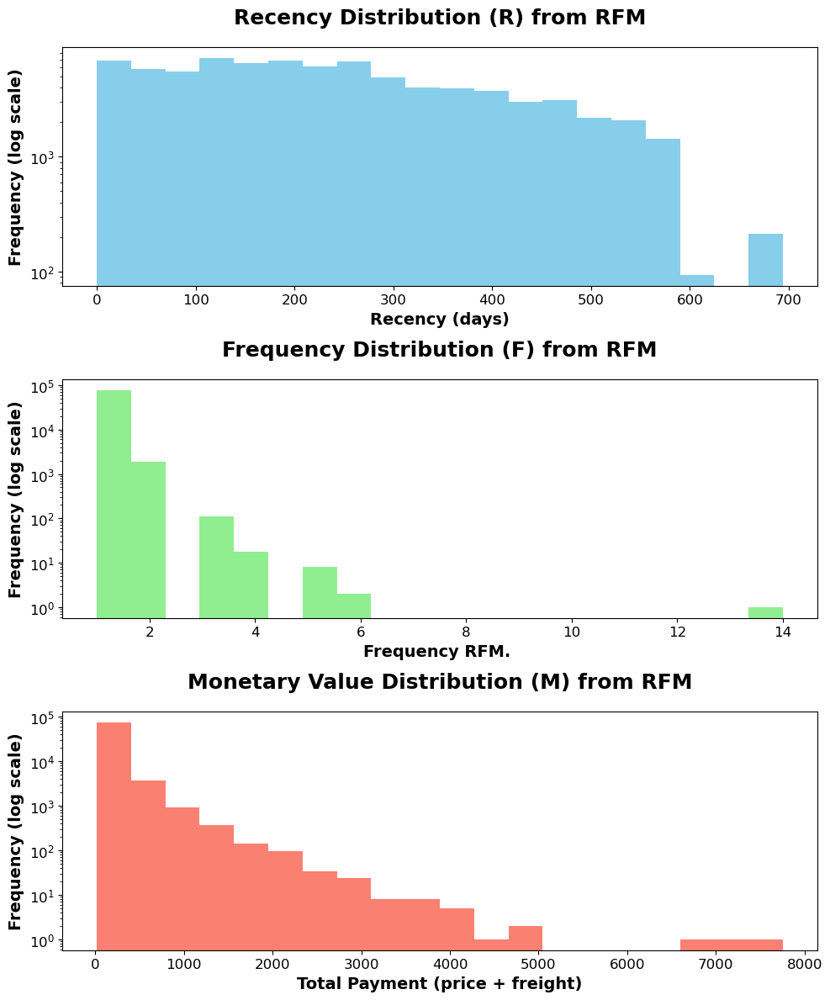

In [42]:
# Create subplots
fig, axes = plt.subplots(3, 1, figsize=(10, 12))

# Plot Recency
axes[0].hist(df_rfm['recency'], bins=20, color='skyblue', align='mid')
axes[0].set_title('Recency Distribution (R) from RFM')
axes[0].set_xlabel('Recency (days)')
axes[0].set_ylabel('Frequency (log scale)')
axes[0].set_yscale('log')  # Set logarithmic scale for y-axis

# Plot Frequency
axes[1].hist(df_rfm['frequency'], bins=20, color='lightgreen',  align='mid')
axes[1].set_title('Frequency Distribution (F) from RFM')
axes[1].set_xlabel('Frequency RFM. ')
axes[1].set_ylabel('Frequency (log scale)')
axes[1].set_yscale('log')  # Set logarithmic scale for y-axis

# Plot Monetary Value
axes[2].hist(df_rfm['total_payment'], bins=20, color='salmon', align='mid')
axes[2].set_title('Monetary Value Distribution (M) from RFM')
axes[2].set_xlabel('Total Payment (price + freight)')
axes[2].set_ylabel('Frequency (log scale)')
axes[2].set_yscale('log')  # Set logarithmic scale for y-axis

# Adjust layout
plt.tight_layout()

# Show plot
plt.show()

## VII.3. We delete the ID featrues

In [43]:
# Now 'order_delivered_customer_date' and 'order_estimated_delivery_date' are not usefull anymore. 
print("Nombre de colonnes avant la suppression :", df_data.shape[1])
df_data = df_data.drop(['review_id', 'order_id', 'order_item_id', 'product_id','seller_id'], axis=1)
print("Nombre de colonnes après la suppression :", df_data.shape[1])

Nombre de colonnes avant la suppression : 22
Nombre de colonnes après la suppression : 17


In [44]:
df_data.columns

Index(['review_score', 'order_purchase_timestamp',
       'order_delivered_customer_date', 'price', 'freight_value',
       'payment_type', 'payment_installments', 'payment_value',
       'customer_unique_id', 'customer_state', 'product_category_name',
       'product_photos_qty', 'product_weight_g', 'product_length_cm',
       'product_height_cm', 'product_width_cm', 'Delivery_Delay'],
      dtype='object')

# VIII. Categorical Features Encoding - One Hot Encoding. 

In [45]:
# ==================================================================================================
# One Hot Encoding for Categorical features.
# ==================================================================================================
# Select categorical features
categorical_features = ['payment_type', 'customer_state', 'product_category_name']

# Perform one-hot encoding for categorical features
print("Nombre de colonnes avant le ONE-HOT ENCODING :", df_data.shape[1])
df_encoded_categorical = pd.get_dummies(df_data[categorical_features])

# Drop original categorical features from df_data
df_data.drop(categorical_features, axis=1, inplace=True)

# Concatenate df_data with one-hot encoded features
df_data= pd.concat([df_data, df_encoded_categorical], axis=1)

# Print the number of columns before and after one-hot encoding
print("Nombre de colonnes apres le ONE-HOT ENCODING :", df_data.shape[1])

# Display the updated DataFrame with one-hot encoded features
display(df_data)


Nombre de colonnes avant le ONE-HOT ENCODING : 17
Nombre de colonnes apres le ONE-HOT ENCODING : 118


,review_score,order_purchase_timestamp,order_delivered_customer_date,price,freight_value,payment_installments,payment_value,customer_unique_id,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,Delivery_Delay,payment_type_boleto,payment_type_credit_card,payment_type_debit_card,payment_type_voucher,customer_state_AC,customer_state_AL,customer_state_AM,customer_state_AP,customer_state_BA,customer_state_CE,customer_state_DF,customer_state_ES,customer_state_GO,customer_state_MA,customer_state_MG,customer_state_MS,customer_state_MT,customer_state_PA,customer_state_PB,customer_state_PE,customer_state_PI,customer_state_PR,customer_state_RJ,customer_state_RN,customer_state_RO,customer_state_RR,customer_state_RS,customer_state_SC,customer_state_SE,customer_state_SP,customer_state_TO,product_category_name_agro_industria_e_comercio,product_category_name_alimentos,product_category_name_alimentos_bebidas,product_category_name_artes,product_category_name_artes_e_artesanato,product_category_name_artigos_de_festas,product_category_name_artigos_de_natal,product_category_name_audio,product_category_name_automotivo,product_category_name_bebes,product_category_name_bebidas,product_category_name_beleza_saude,product_category_name_brinquedos,product_category_name_cama_mesa_banho,product_category_name_casa_conforto,product_category_name_casa_conforto_2,product_category_name_casa_construcao,product_category_name_cds_dvds_musicais,product_category_name_cine_foto,product_category_name_climatizacao,product_category_name_consoles_games,product_category_name_construcao_ferramentas_construcao,product_category_name_construcao_ferramentas_ferramentas,product_category_name_construcao_ferramentas_iluminacao,product_category_name_construcao_ferramentas_jardim,product_category_name_construcao_ferramentas_seguranca,product_category_name_cool_stuff,product_category_name_dvds_blu_ray,product_category_name_eletrodomesticos,product_category_name_eletrodomesticos_2,product_category_name_eletronicos,product_category_name_eletroportateis,product_category_name_esporte_lazer,product_category_name_fashion_bolsas_e_acessorios,product_category_name_fashion_calcados,product_category_name_fashion_esporte,product_category_name_fashion_roupa_feminina,product_category_name_fashion_roupa_infanto_juvenil,product_category_name_fashion_roupa_masculina,product_category_name_fashion_underwear_e_moda_praia,product_category_name_ferramentas_jardim,product_category_name_flores,product_category_name_fraldas_higiene,product_category_name_industria_comercio_e_negocios,product_category_name_informatica_acessorios,product_category_name_instrumentos_musicais,product_category_name_la_cuisine,product_category_name_livros_importados,product_category_name_livros_interesse_geral,product_category_name_livros_tecnicos,product_category_name_malas_acessorios,product_category_name_market_place,product_category_name_moveis_colchao_e_estofado,product_category_name_moveis_cozinha_area_de_servico_jantar_e_jardim,product_category_name_moveis_decoracao,product_category_name_moveis_escritorio,product_category_name_moveis_quarto,product_category_name_moveis_sala,product_category_name_musica,product_category_name_papelaria,product_category_name_pc_gamer,product_category_name_pcs,product_category_name_perfumaria,product_category_name_pet_shop,product_category_name_portateis_casa_forno_e_cafe,product_category_name_portateis_cozinha_e_preparadores_de_alimentos,product_category_name_relogios_presentes,product_category_name_seguros_e_servicos,product_category_name_sinalizacao_e_seguranca,product_category_name_tablets_impressao_imagem,product_category_name_telefonia,product_category_name_telefonia_fixa,product_category_name_utilidades_domesticas
88,4,2017-05-18 20:51:06,2017-06-02 11:26:06,69.99,22.07,6,65.84,a7657330b1c135f3acd420326e335b2c,1.0,100.0,17.0,3.0,12.0,-7,False,True,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,Fal

# IX. WE REGROUP THE ROWS by unique customer ('customer_unique_id') for df_data

In a similar way that in the section VII.1. Delete Payment Anomalies, we are going to regroup the customer and order so each row correspond to a unique customer/order. 

In [46]:
df_data

,review_score,order_purchase_timestamp,order_delivered_customer_date,price,freight_value,payment_installments,payment_value,customer_unique_id,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,Delivery_Delay,payment_type_boleto,payment_type_credit_card,payment_type_debit_card,payment_type_voucher,customer_state_AC,customer_state_AL,customer_state_AM,customer_state_AP,customer_state_BA,customer_state_CE,customer_state_DF,customer_state_ES,customer_state_GO,customer_state_MA,customer_state_MG,customer_state_MS,customer_state_MT,customer_state_PA,customer_state_PB,customer_state_PE,customer_state_PI,customer_state_PR,customer_state_RJ,customer_state_RN,customer_state_RO,customer_state_RR,customer_state_RS,customer_state_SC,customer_state_SE,customer_state_SP,customer_state_TO,product_category_name_agro_industria_e_comercio,product_category_name_alimentos,product_category_name_alimentos_bebidas,product_category_name_artes,product_category_name_artes_e_artesanato,product_category_name_artigos_de_festas,product_category_name_artigos_de_natal,product_category_name_audio,product_category_name_automotivo,product_category_name_bebes,product_category_name_bebidas,product_category_name_beleza_saude,product_category_name_brinquedos,product_category_name_cama_mesa_banho,product_category_name_casa_conforto,product_category_name_casa_conforto_2,product_category_name_casa_construcao,product_category_name_cds_dvds_musicais,product_category_name_cine_foto,product_category_name_climatizacao,product_category_name_consoles_games,product_category_name_construcao_ferramentas_construcao,product_category_name_construcao_ferramentas_ferramentas,product_category_name_construcao_ferramentas_iluminacao,product_category_name_construcao_ferramentas_jardim,product_category_name_construcao_ferramentas_seguranca,product_category_name_cool_stuff,product_category_name_dvds_blu_ray,product_category_name_eletrodomesticos,product_category_name_eletrodomesticos_2,product_category_name_eletronicos,product_category_name_eletroportateis,product_category_name_esporte_lazer,product_category_name_fashion_bolsas_e_acessorios,product_category_name_fashion_calcados,product_category_name_fashion_esporte,product_category_name_fashion_roupa_feminina,product_category_name_fashion_roupa_infanto_juvenil,product_category_name_fashion_roupa_masculina,product_category_name_fashion_underwear_e_moda_praia,product_category_name_ferramentas_jardim,product_category_name_flores,product_category_name_fraldas_higiene,product_category_name_industria_comercio_e_negocios,product_category_name_informatica_acessorios,product_category_name_instrumentos_musicais,product_category_name_la_cuisine,product_category_name_livros_importados,product_category_name_livros_interesse_geral,product_category_name_livros_tecnicos,product_category_name_malas_acessorios,product_category_name_market_place,product_category_name_moveis_colchao_e_estofado,product_category_name_moveis_cozinha_area_de_servico_jantar_e_jardim,product_category_name_moveis_decoracao,product_category_name_moveis_escritorio,product_category_name_moveis_quarto,product_category_name_moveis_sala,product_category_name_musica,product_category_name_papelaria,product_category_name_pc_gamer,product_category_name_pcs,product_category_name_perfumaria,product_category_name_pet_shop,product_category_name_portateis_casa_forno_e_cafe,product_category_name_portateis_cozinha_e_preparadores_de_alimentos,product_category_name_relogios_presentes,product_category_name_seguros_e_servicos,product_category_name_sinalizacao_e_seguranca,product_category_name_tablets_impressao_imagem,product_category_name_telefonia,product_category_name_telefonia_fixa,product_category_name_utilidades_domesticas
88,4,2017-05-18 20:51:06,2017-06-02 11:26:06,69.99,22.07,6,65.84,a7657330b1c135f3acd420326e335b2c,1.0,100.0,17.0,3.0,12.0,-7,False,True,False,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,Fal

In [47]:
# Define the list of columnswhich function is not first in the aggregation. 
exclude_cols = ['customer_unique_id', 'price', 'freight_value', 'order_delivered_customer_date', 
                'review_score', 'payment_installments', 'product_id', 'product_photos_qty', 
                'product_length_cm', 'product_height_cm', 'product_width_cm', 'Delivery_Delay', 
                'payment_value', 'order_id']

# Group df_data by 'customer_unique_id' and 'order_purchase_timestamp' and aggregate sum of 'price' and 'freight_value'
df_data = df_data.groupby(['customer_unique_id']).agg({
    'price': 'sum',
    'freight_value': 'sum',
    'order_delivered_customer_date': 'mean',
    'review_score': 'mean',
    'payment_installments': 'mean',
    'product_photos_qty': 'mean',
    'product_length_cm': 'mean',
    'product_height_cm': 'mean',
    'product_width_cm': 'mean',
    'Delivery_Delay': 'mean',
    'payment_value': 'sum',
    
    # Include all other columns in the aggregation
    **{col: 'first' for col in df_data.columns if col not in exclude_cols}
}).reset_index()

print("Shape of grouped_data:", df_data.shape) # Display the shape of grouped_data
display(df_data)

Shape of grouped_data: (80144, 118)


,customer_unique_id,price,freight_value,order_delivered_customer_date,review_score,payment_installments,product_photos_qty,product_length_cm,product_height_cm,product_width_cm,Delivery_Delay,payment_value,order_purchase_timestamp,product_weight_g,payment_type_boleto,payment_type_credit_card,payment_type_debit_card,payment_type_voucher,customer_state_AC,customer_state_AL,customer_state_AM,customer_state_AP,customer_state_BA,customer_state_CE,customer_state_DF,customer_state_ES,customer_state_GO,customer_state_MA,customer_state_MG,customer_state_MS,customer_state_MT,customer_state_PA,customer_state_PB,customer_state_PE,customer_state_PI,customer_state_PR,customer_state_RJ,customer_state_RN,customer_state_RO,customer_state_RR,customer_state_RS,customer_state_SC,customer_state_SE,customer_state_SP,customer_state_TO,product_category_name_agro_industria_e_comercio,product_category_name_alimentos,product_category_name_alimentos_bebidas,product_category_name_artes,product_category_name_artes_e_artesanato,product_category_name_artigos_de_festas,product_category_name_artigos_de_natal,product_category_name_audio,product_category_name_automotivo,product_category_name_bebes,product_category_name_bebidas,product_category_name_beleza_saude,product_category_name_brinquedos,product_category_name_cama_mesa_banho,product_category_name_casa_conforto,product_category_name_casa_conforto_2,product_category_name_casa_construcao,product_category_name_cds_dvds_musicais,product_category_name_cine_foto,product_category_name_climatizacao,product_category_name_consoles_games,product_category_name_construcao_ferramentas_construcao,product_category_name_construcao_ferramentas_ferramentas,product_category_name_construcao_ferramentas_iluminacao,product_category_name_construcao_ferramentas_jardim,product_category_name_construcao_ferramentas_seguranca,product_category_name_cool_stuff,product_category_name_dvds_blu_ray,product_category_name_eletrodomesticos,product_category_name_eletrodomesticos_2,product_category_name_eletronicos,product_category_name_eletroportateis,product_category_name_esporte_lazer,product_category_name_fashion_bolsas_e_acessorios,product_category_name_fashion_calcados,product_category_name_fashion_esporte,product_category_name_fashion_roupa_feminina,product_category_name_fashion_roupa_infanto_juvenil,product_category_name_fashion_roupa_masculina,product_category_name_fashion_underwear_e_moda_praia,product_category_name_ferramentas_jardim,product_category_name_flores,product_category_name_fraldas_higiene,product_category_name_industria_comercio_e_negocios,product_category_name_informatica_acessorios,product_category_name_instrumentos_musicais,product_category_name_la_cuisine,product_category_name_livros_importados,product_category_name_livros_interesse_geral,product_category_name_livros_tecnicos,product_category_name_malas_acessorios,product_category_name_market_place,product_category_name_moveis_colchao_e_estofado,product_category_name_moveis_cozinha_area_de_servico_jantar_e_jardim,product_category_name_moveis_decoracao,product_category_name_moveis_escritorio,product_category_name_moveis_quarto,product_category_name_moveis_sala,product_category_name_musica,product_category_name_papelaria,product_category_name_pc_gamer,product_category_name_pcs,product_category_name_perfumaria,product_category_name_pet_shop,product_category_name_portateis_casa_forno_e_cafe,product_category_name_portateis_cozinha_e_preparadores_de_alimentos,product_category_name_relogios_presentes,product_category_name_seguros_e_servicos,product_category_name_sinalizacao_e_seguranca,product_category_name_tablets_impressao_imagem,product_category_name_telefonia,product_category_name_telefonia_fixa,product_category_name_utilidades_domesticas
0,0000366f3b9a7992bf8c76cfdf3221e2,129.90,12.00,2018-05-16 20:48:37,5.0,8.0,1.0,34.0,7.0,32.0,-5.0,141.90,2018-05-10 10:56:27,1500.0,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,

# X. WE MERGE df_rfm and df_data. 

In [48]:
# Merge df_rfm and df_data on 'customer_unique_id' and 'order_purchase_timestamp'
# df_data = pd.merge(df_rfm, df_data, on=['customer_unique_id', 'order_purchase_timestamp'], how='inner')

df_data = pd.merge(df_rfm, df_data, on=['customer_unique_id'], how='inner')

# Set 'customer_unique_id' as the index
df_data.set_index('customer_unique_id', inplace=True)

# Display the merged dataframe
display(df_data)


,order_purchase_timestamp_x,recency,frequency,total_payment,price,freight_value,order_delivered_customer_date,review_score,payment_installments,product_photos_qty,product_length_cm,product_height_cm,product_width_cm,Delivery_Delay,payment_value,order_purchase_timestamp_y,product_weight_g,payment_type_boleto,payment_type_credit_card,payment_type_debit_card,payment_type_voucher,customer_state_AC,customer_state_AL,customer_state_AM,customer_state_AP,customer_state_BA,customer_state_CE,customer_state_DF,customer_state_ES,customer_state_GO,customer_state_MA,customer_state_MG,customer_state_MS,customer_state_MT,customer_state_PA,customer_state_PB,customer_state_PE,customer_state_PI,customer_state_PR,customer_state_RJ,customer_state_RN,customer_state_RO,customer_state_RR,customer_state_RS,customer_state_SC,customer_state_SE,customer_state_SP,customer_state_TO,product_category_name_agro_industria_e_comercio,product_category_name_alimentos,product_category_name_alimentos_bebidas,product_category_name_artes,product_category_name_artes_e_artesanato,product_category_name_artigos_de_festas,product_category_name_artigos_de_natal,product_category_name_audio,product_category_name_automotivo,product_category_name_bebes,product_category_name_bebidas,product_category_name_beleza_saude,product_category_name_brinquedos,product_category_name_cama_mesa_banho,product_category_name_casa_conforto,product_category_name_casa_conforto_2,product_category_name_casa_construcao,product_category_name_cds_dvds_musicais,product_category_name_cine_foto,product_category_name_climatizacao,product_category_name_consoles_games,product_category_name_construcao_ferramentas_construcao,product_category_name_construcao_ferramentas_ferramentas,product_category_name_construcao_ferramentas_iluminacao,product_category_name_construcao_ferramentas_jardim,product_category_name_construcao_ferramentas_seguranca,product_category_name_cool_stuff,product_category_name_dvds_blu_ray,product_category_name_eletrodomesticos,product_category_name_eletrodomesticos_2,product_category_name_eletronicos,product_category_name_eletroportateis,product_category_name_esporte_lazer,product_category_name_fashion_bolsas_e_acessorios,product_category_name_fashion_calcados,product_category_name_fashion_esporte,product_category_name_fashion_roupa_feminina,product_category_name_fashion_roupa_infanto_juvenil,product_category_name_fashion_roupa_masculina,product_category_name_fashion_underwear_e_moda_praia,product_category_name_ferramentas_jardim,product_category_name_flores,product_category_name_fraldas_higiene,product_category_name_industria_comercio_e_negocios,product_category_name_informatica_acessorios,product_category_name_instrumentos_musicais,product_category_name_la_cuisine,product_category_name_livros_importados,product_category_name_livros_interesse_geral,product_category_name_livros_tecnicos,product_category_name_malas_acessorios,product_category_name_market_place,product_category_name_moveis_colchao_e_estofado,product_category_name_moveis_cozinha_area_de_servico_jantar_e_jardim,product_category_name_moveis_decoracao,product_category_name_moveis_escritorio,product_category_name_moveis_quarto,product_category_name_moveis_sala,product_category_name_musica,product_category_name_papelaria,product_category_name_pc_gamer,product_category_name_pcs,product_category_name_perfumaria,product_category_name_pet_shop,product_category_name_portateis_casa_forno_e_cafe,product_category_name_portateis_cozinha_e_preparadores_de_alimentos,product_category_name_relogios_presentes,product_category_name_seguros_e_servicos,product_category_name_sinalizacao_e_seguranca,product_category_name_tablets_impressao_imagem,product_category_name_telefonia,product_category_name_telefonia_fixa,product_category_name_utilidades_domesticas
customer_unique_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,2018-05-10 10:56:27,111,1

In [49]:
# We drop the date column. We don't need it anymore. 
# Now 'order_delivered_customer_date' and 'order_estimated_delivery_date' are not usefull anymore. 
print("Nombre de colonnes avant la suppression :", df_data.shape[1])
df_data = df_data.drop(['order_purchase_timestamp_x', 'order_delivered_customer_date', 'order_purchase_timestamp_y'], axis=1)
print("Nombre de colonnes après la suppression :", df_data.shape[1])

Nombre de colonnes avant la suppression : 121
Nombre de colonnes après la suppression : 118


# XI. Univariate Analysis

D:\ANACONDA\envs\OC_PROJET2\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


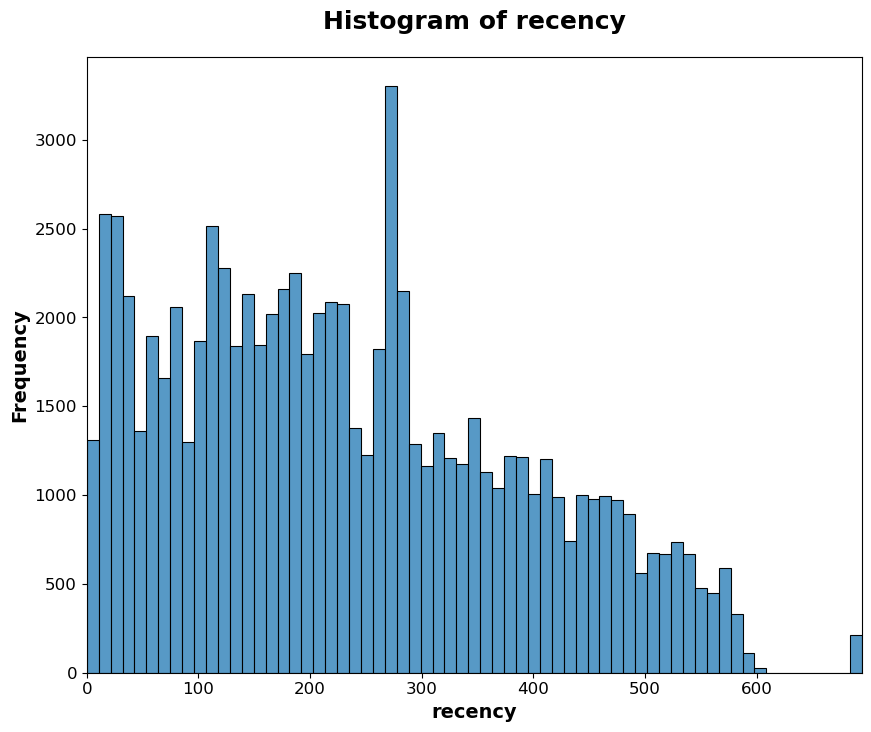

D:\ANACONDA\envs\OC_PROJET2\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


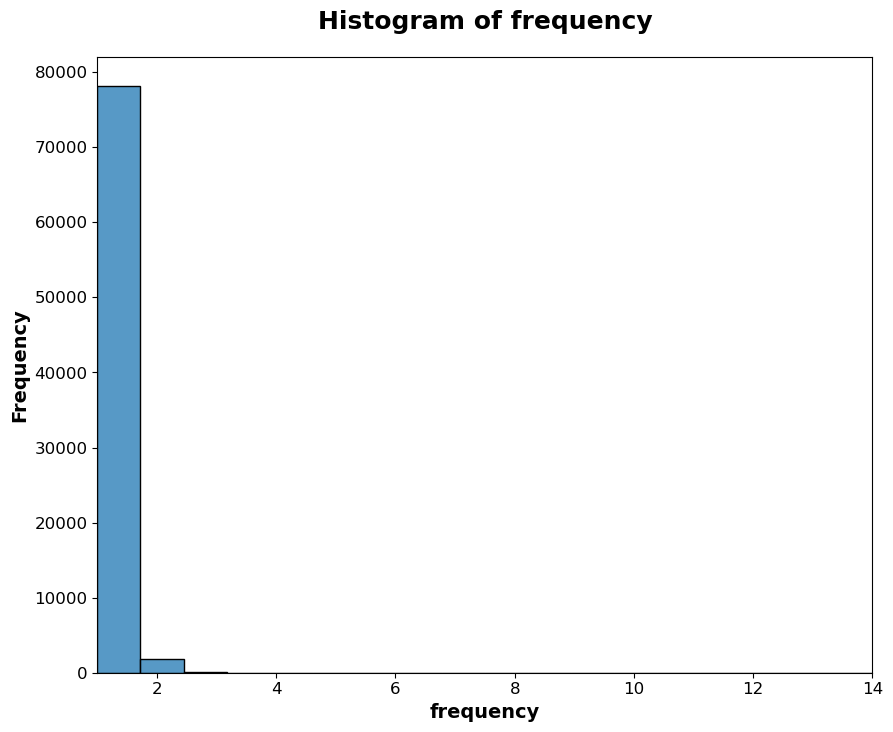

D:\ANACONDA\envs\OC_PROJET2\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


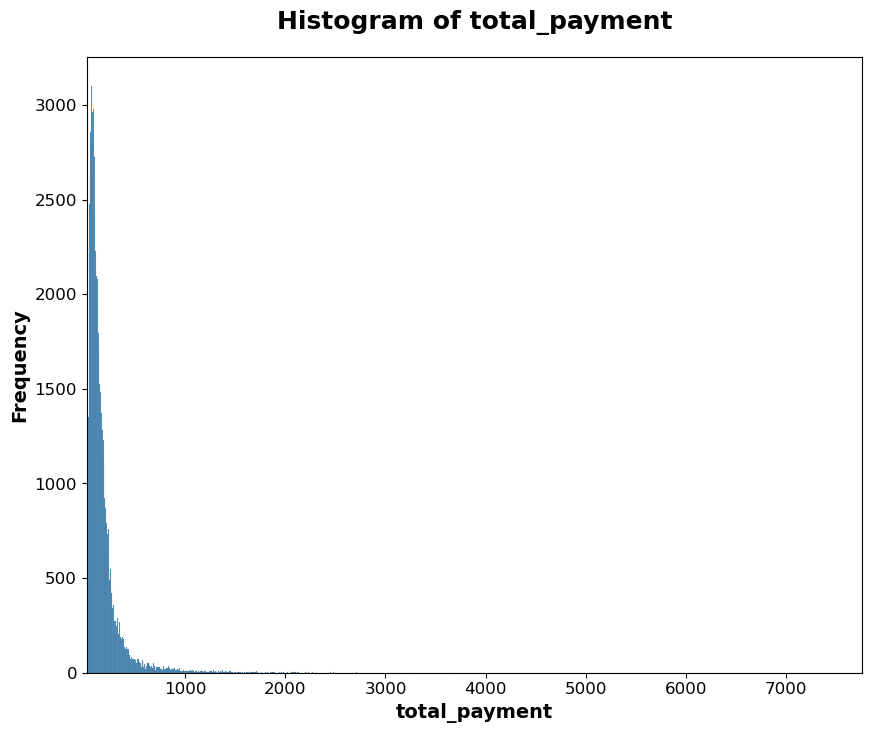

D:\ANACONDA\envs\OC_PROJET2\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


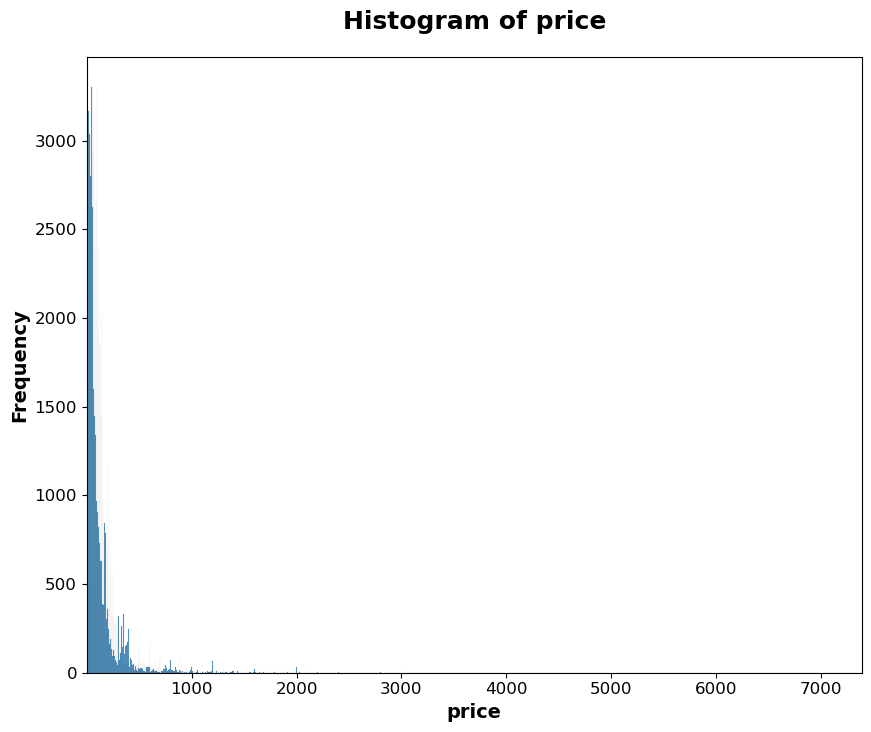

D:\ANACONDA\envs\OC_PROJET2\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


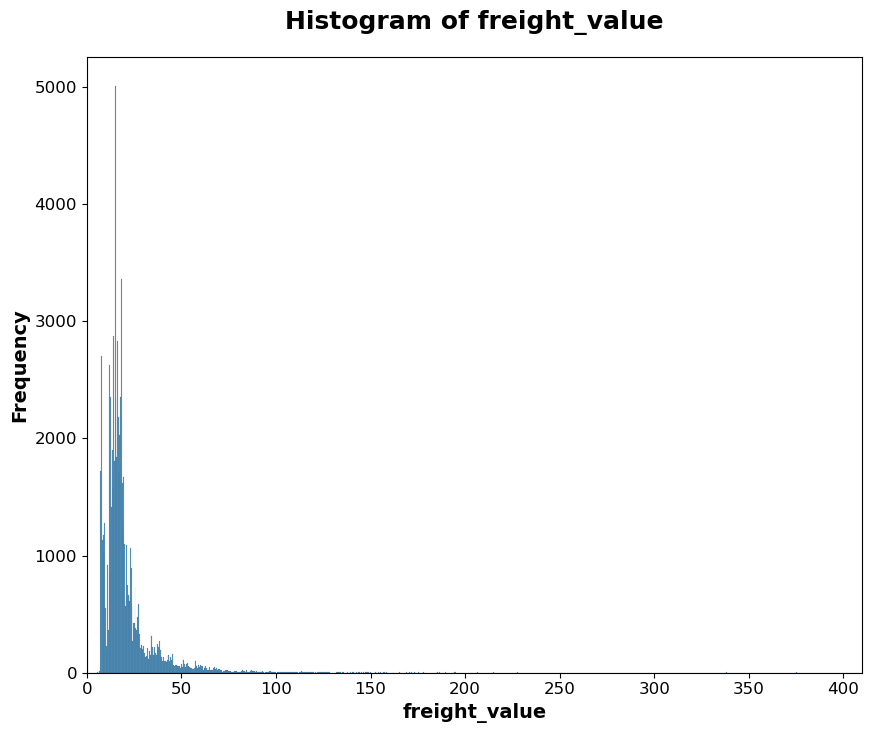

D:\ANACONDA\envs\OC_PROJET2\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


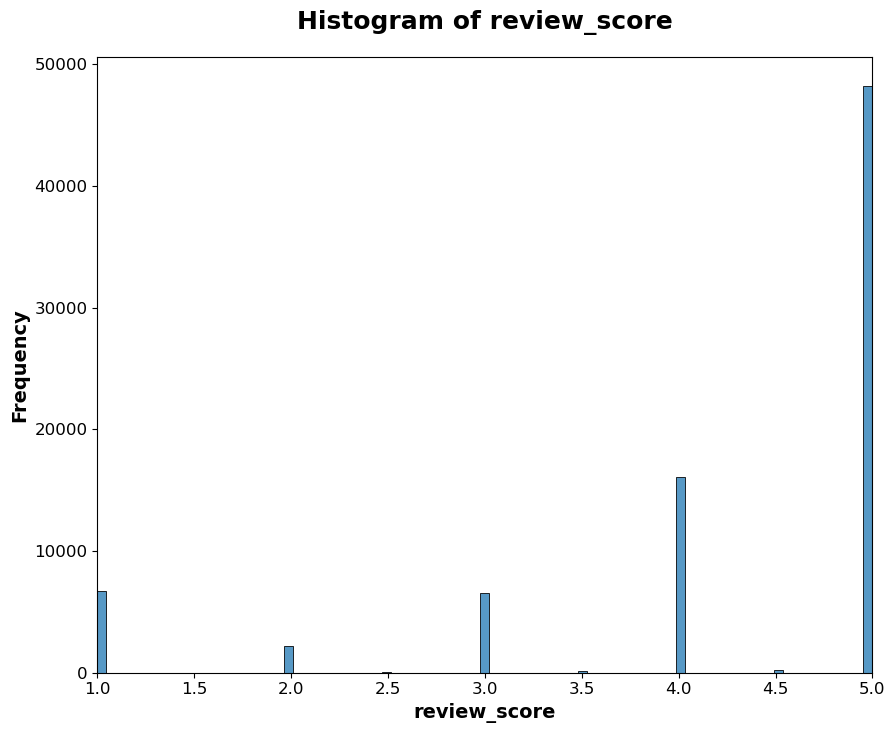

D:\ANACONDA\envs\OC_PROJET2\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


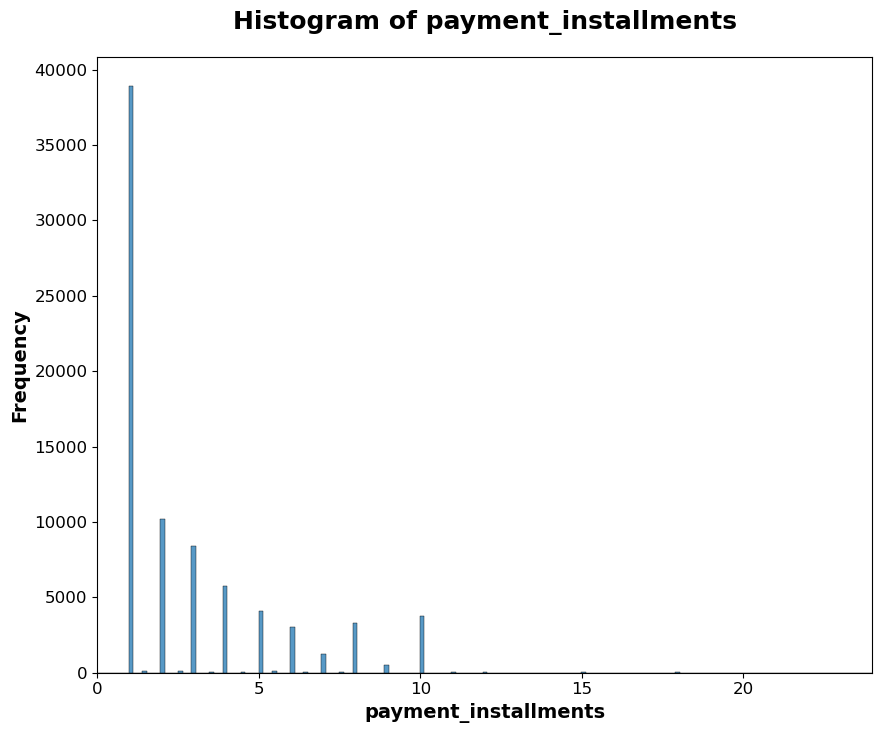

D:\ANACONDA\envs\OC_PROJET2\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


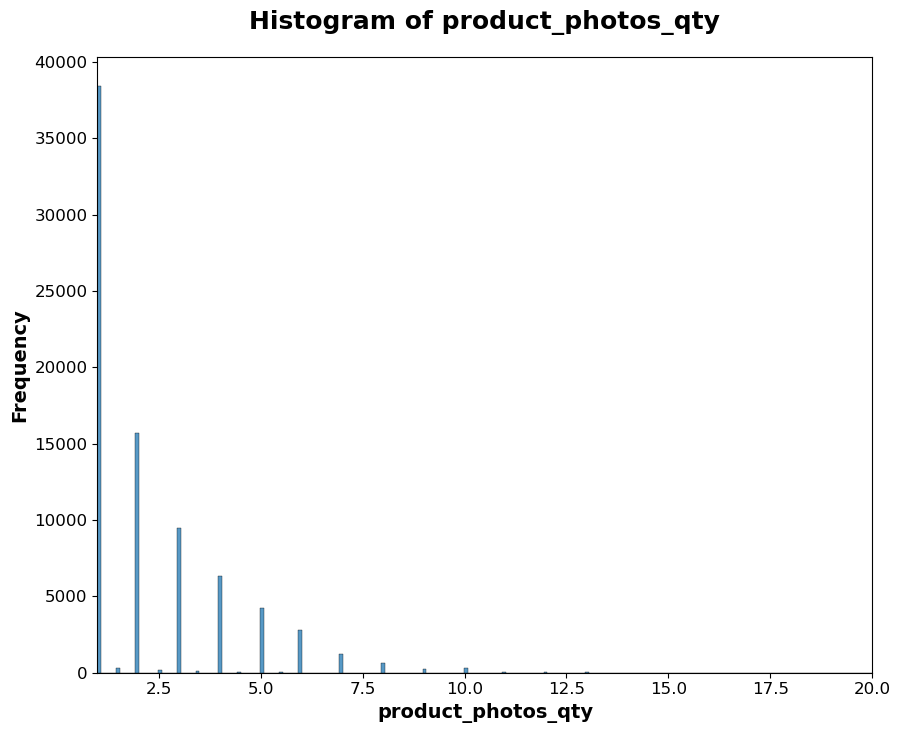

D:\ANACONDA\envs\OC_PROJET2\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


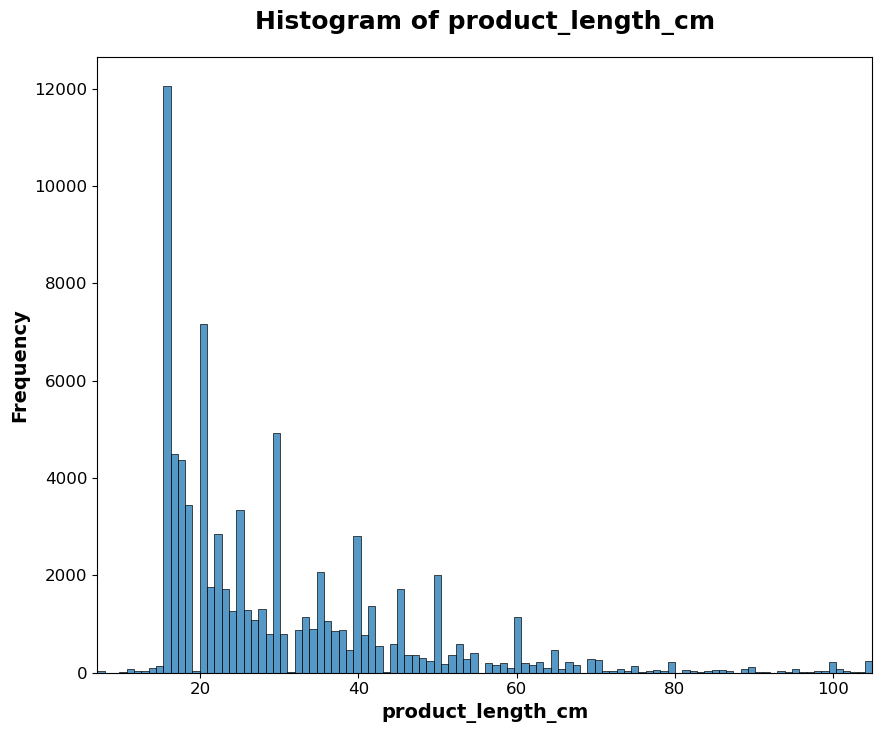

D:\ANACONDA\envs\OC_PROJET2\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


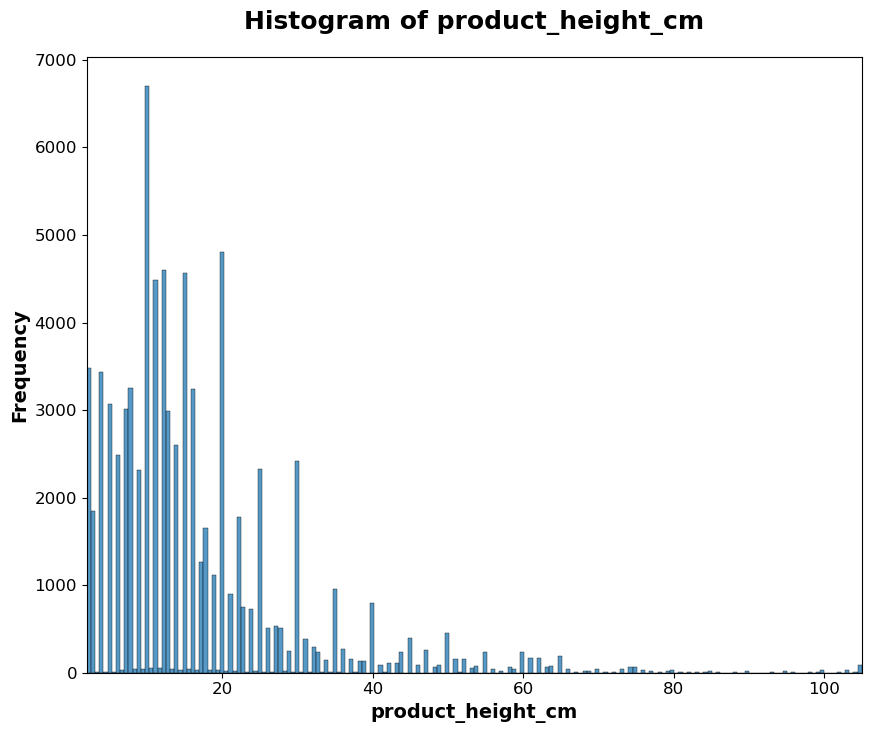

D:\ANACONDA\envs\OC_PROJET2\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


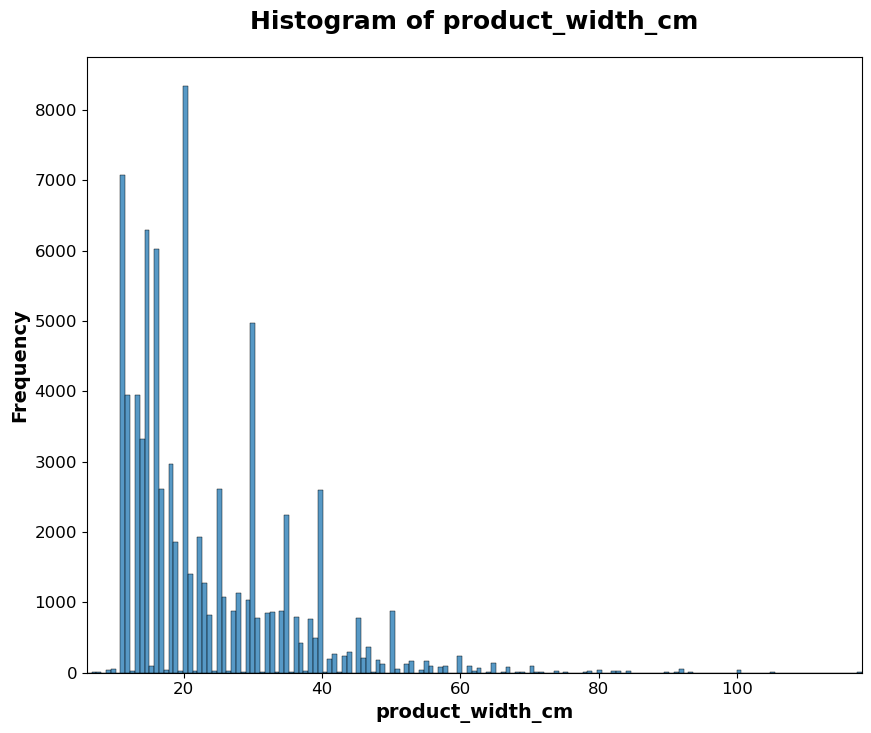

D:\ANACONDA\envs\OC_PROJET2\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


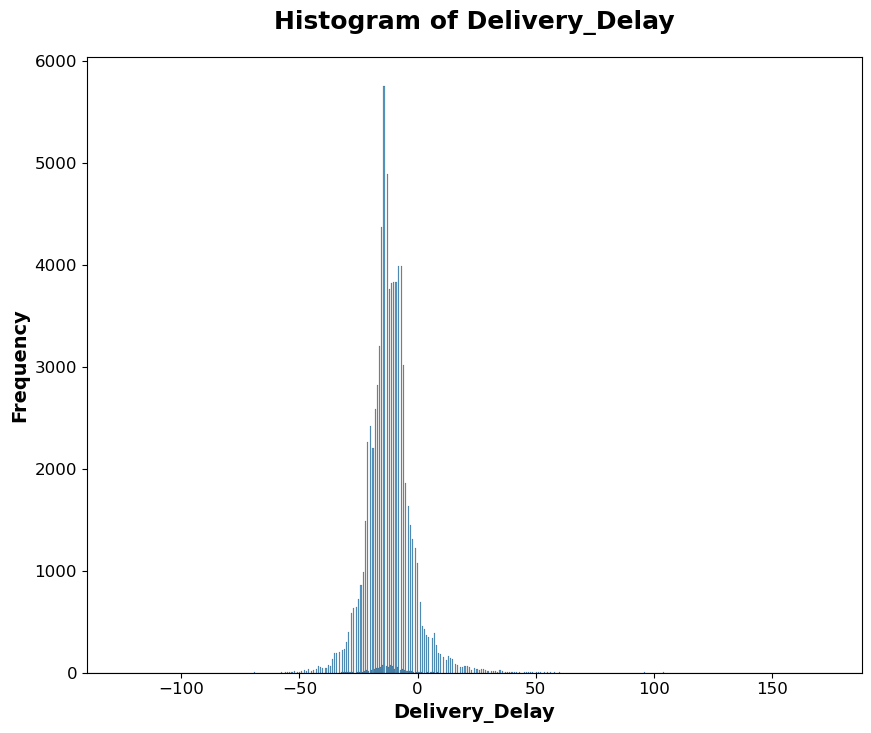

D:\ANACONDA\envs\OC_PROJET2\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


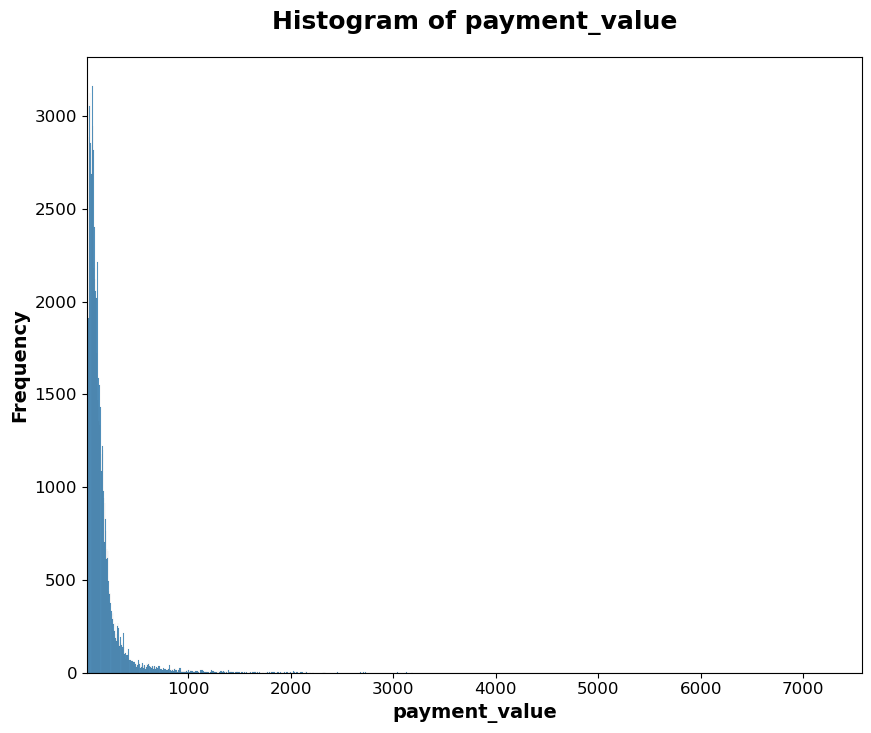

D:\ANACONDA\envs\OC_PROJET2\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


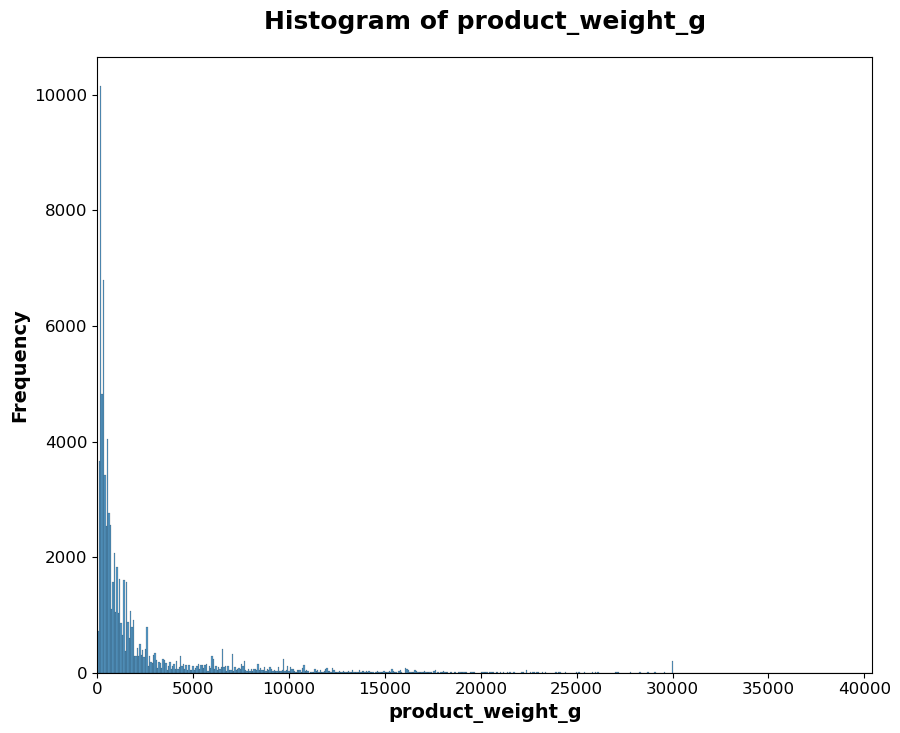

In [50]:
columns_to_check = ['recency', 'frequency', 'total_payment', 'price', 'freight_value', 'review_score', 'payment_installments', 'product_photos_qty', 'product_length_cm', 'product_height_cm', 'product_width_cm', 'Delivery_Delay', 'payment_value', 'product_weight_g']

# Iterate over each column in df_data
for column in columns_to_check:
    # Check the data type of the column
    if df_data[column].dtype == 'object':
        # For categorical features, create a count plot
        plt.figure(figsize=(10, 8))
        sns.countplot(data=df_data, x=column, order=df_data[column].value_counts().index)
        plt.title(f'Count Plot of {column}')
        plt.xlabel(column)
        plt.ylabel('Count')
        plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
    else:
        # For numerical features, create a histogram
        plt.figure(figsize=(10, 8))
        sns.histplot(data=df_data, x=column, kde=False)
        plt.title(f'Histogram of {column}')
        plt.xlabel(column)
        plt.ylabel('Frequency')
        plt.xlim(df_data[column].min(), df_data[column].max())  # Set x-axis limits based on data range

    # Show the plot
    plt.show()


Index(['recency', 'frequency', 'total_payment', 'price', 'freight_value',
       'review_score', 'payment_installments', 'product_photos_qty',
       'product_length_cm', 'product_height_cm', 'product_width_cm',
       'Delivery_Delay', 'payment_value', 'product_weight_g'],
      dtype='object')

D:\ANACONDA\envs\OC_PROJET2\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
D:\ANACONDA\envs\OC_PROJET2\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
D:\ANACONDA\envs\OC_PROJET2\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
D:\ANACONDA\envs\OC_PROJET2\Lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN befo

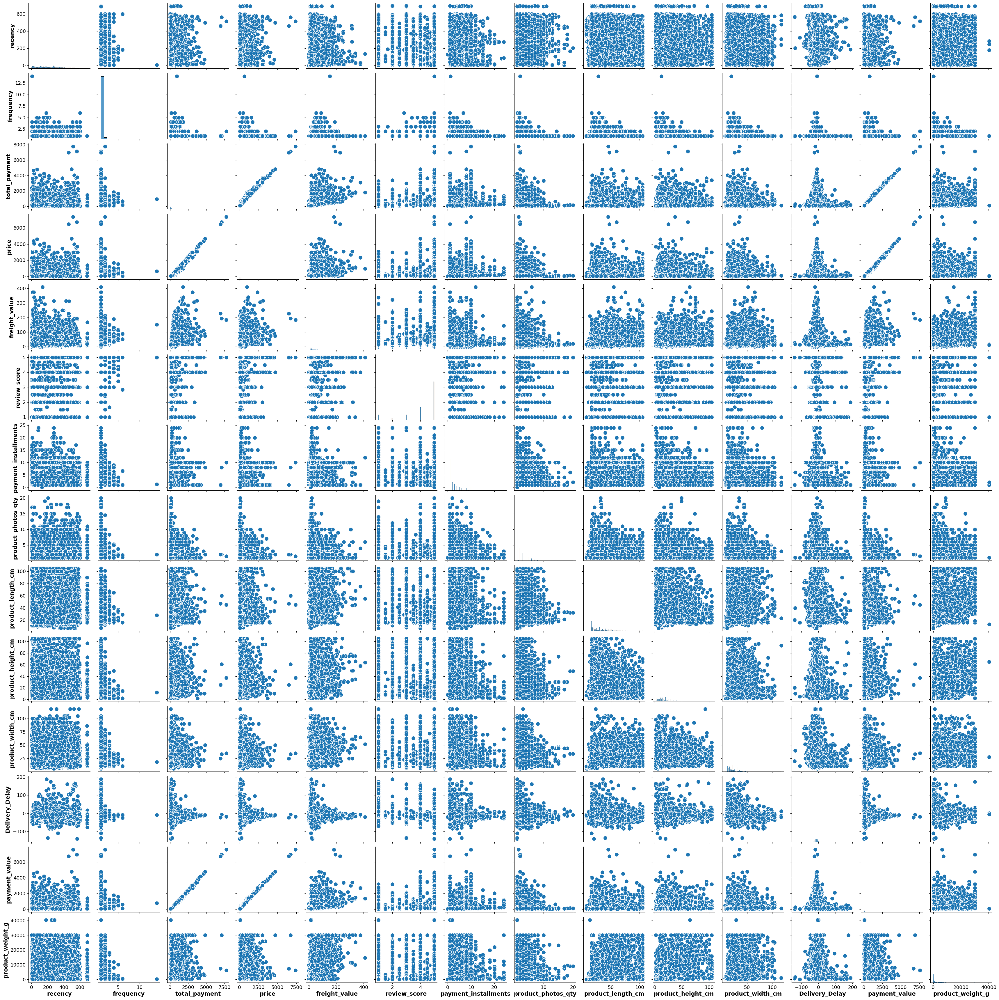

In [51]:
# # Select numerical features
# numerical_features = df_data.select_dtypes(include=['int64', 'float64']).columns
# display(numerical_features)
# # Pairwise scatter plots for numerical features
# sns.pairplot(df_data[numerical_features])
# plt.show()

# XI. SAVE DATA

In [55]:
# ==================================================================================================
# SAVE DATA INTO EXCEL (df_data.xlsx)
# ==================================================================================================

# Specify the file path where you want to save the CSV file
csv_file_path = r'C:\Users\Olivi\OneDrive\Documents\OC_Formation_DATA_SCIENCE\PROJET5_segmentez_des_clients_dun_site_ecommerce\DATA\df_data.csv'

# Write the DataFrame to CSV
df_data.to_csv(csv_file_path, index=True)

# Print a message indicating the successful save
print(f"Cleaned data has been successfully saved to: {csv_file_path}")





Cleaned data has been successfully saved to: C:\Users\Olivi\OneDrive\Documents\OC_Formation_DATA_SCIENCE\PROJET5_segmentez_des_clients_dun_site_ecommerce\DATA\df_data.csv


In [56]:
df_data.columns

Index(['recency', 'frequency', 'total_payment', 'price', 'freight_value',
       'review_score', 'payment_installments', 'product_photos_qty',
       'product_length_cm', 'product_height_cm',
       ...
       'product_category_name_pet_shop',
       'product_category_name_portateis_casa_forno_e_cafe',
       'product_category_name_portateis_cozinha_e_preparadores_de_alimentos',
       'product_category_name_relogios_presentes',
       'product_category_name_seguros_e_servicos',
       'product_category_name_sinalizacao_e_seguranca',
       'product_category_name_tablets_impressao_imagem',
       'product_category_name_telefonia',
       'product_category_name_telefonia_fixa',
       'product_category_name_utilidades_domesticas'],
      dtype='object', length=118)

In [57]:
df_data

,recency,frequency,total_payment,price,freight_value,review_score,payment_installments,product_photos_qty,product_length_cm,product_height_cm,product_width_cm,Delivery_Delay,payment_value,product_weight_g,payment_type_boleto,payment_type_credit_card,payment_type_debit_card,payment_type_voucher,customer_state_AC,customer_state_AL,customer_state_AM,customer_state_AP,customer_state_BA,customer_state_CE,customer_state_DF,customer_state_ES,customer_state_GO,customer_state_MA,customer_state_MG,customer_state_MS,customer_state_MT,customer_state_PA,customer_state_PB,customer_state_PE,customer_state_PI,customer_state_PR,customer_state_RJ,customer_state_RN,customer_state_RO,customer_state_RR,customer_state_RS,customer_state_SC,customer_state_SE,customer_state_SP,customer_state_TO,product_category_name_agro_industria_e_comercio,product_category_name_alimentos,product_category_name_alimentos_bebidas,product_category_name_artes,product_category_name_artes_e_artesanato,product_category_name_artigos_de_festas,product_category_name_artigos_de_natal,product_category_name_audio,product_category_name_automotivo,product_category_name_bebes,product_category_name_bebidas,product_category_name_beleza_saude,product_category_name_brinquedos,product_category_name_cama_mesa_banho,product_category_name_casa_conforto,product_category_name_casa_conforto_2,product_category_name_casa_construcao,product_category_name_cds_dvds_musicais,product_category_name_cine_foto,product_category_name_climatizacao,product_category_name_consoles_games,product_category_name_construcao_ferramentas_construcao,product_category_name_construcao_ferramentas_ferramentas,product_category_name_construcao_ferramentas_iluminacao,product_category_name_construcao_ferramentas_jardim,product_category_name_construcao_ferramentas_seguranca,product_category_name_cool_stuff,product_category_name_dvds_blu_ray,product_category_name_eletrodomesticos,product_category_name_eletrodomesticos_2,product_category_name_eletronicos,product_category_name_eletroportateis,product_category_name_esporte_lazer,product_category_name_fashion_bolsas_e_acessorios,product_category_name_fashion_calcados,product_category_name_fashion_esporte,product_category_name_fashion_roupa_feminina,product_category_name_fashion_roupa_infanto_juvenil,product_category_name_fashion_roupa_masculina,product_category_name_fashion_underwear_e_moda_praia,product_category_name_ferramentas_jardim,product_category_name_flores,product_category_name_fraldas_higiene,product_category_name_industria_comercio_e_negocios,product_category_name_informatica_acessorios,product_category_name_instrumentos_musicais,product_category_name_la_cuisine,product_category_name_livros_importados,product_category_name_livros_interesse_geral,product_category_name_livros_tecnicos,product_category_name_malas_acessorios,product_category_name_market_place,product_category_name_moveis_colchao_e_estofado,product_category_name_moveis_cozinha_area_de_servico_jantar_e_jardim,product_category_name_moveis_decoracao,product_category_name_moveis_escritorio,product_category_name_moveis_quarto,product_category_name_moveis_sala,product_category_name_musica,product_category_name_papelaria,product_category_name_pc_gamer,product_category_name_pcs,product_category_name_perfumaria,product_category_name_pet_shop,product_category_name_portateis_casa_forno_e_cafe,product_category_name_portateis_cozinha_e_preparadores_de_alimentos,product_category_name_relogios_presentes,product_category_name_seguros_e_servicos,product_category_name_sinalizacao_e_seguranca,product_category_name_tablets_impressao_imagem,product_category_name_telefonia,product_category_name_telefonia_fixa,product_category_name_utilidades_domesticas
customer_unique_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,111,1,153.90,129.90,12.00,5.0,8.0,1.0,34.0,7.0,32.0,-5.0,141.90,1500.0,False,True,False,False,False,False,False,